[View on GitHub](https://github.com/PICOTERMS/Text-Mining/tree/main/All%20the%20speeches%20of%20presidents%20of%20the%20USA)

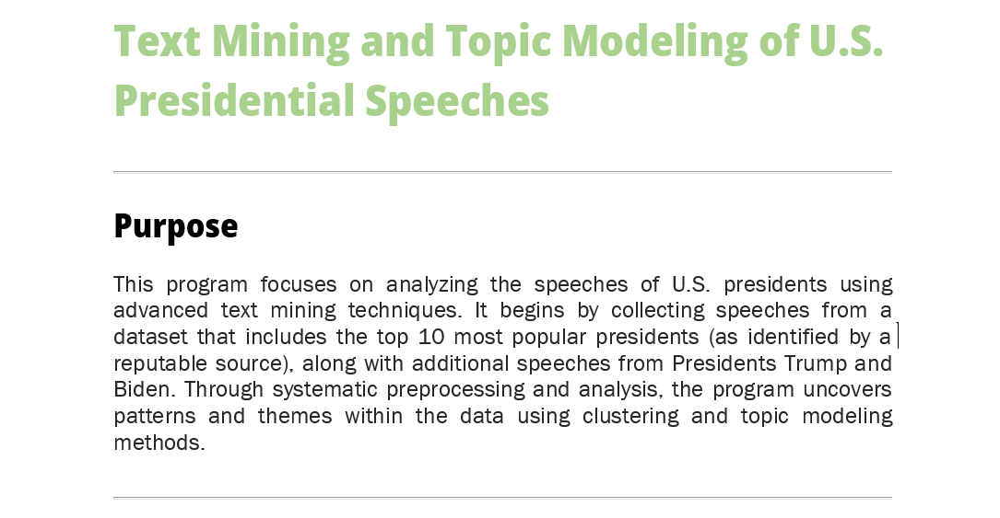

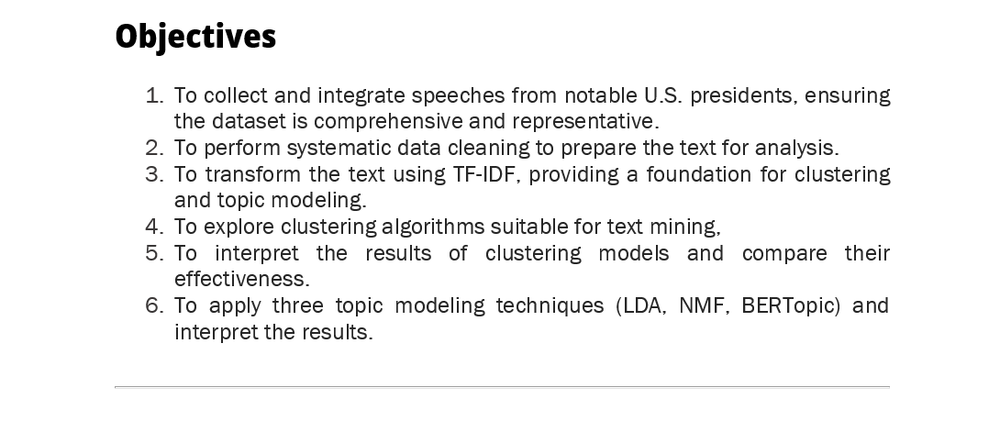

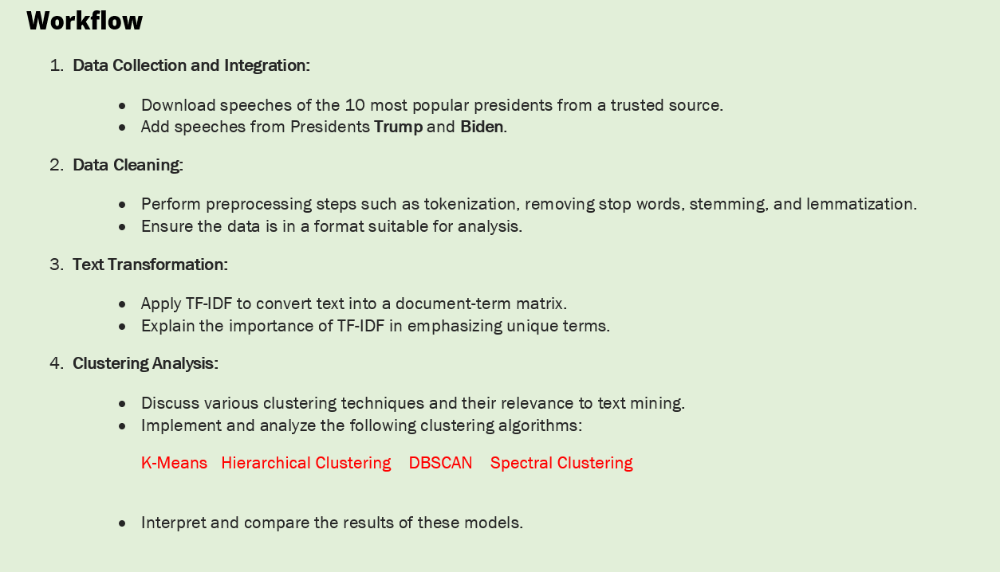

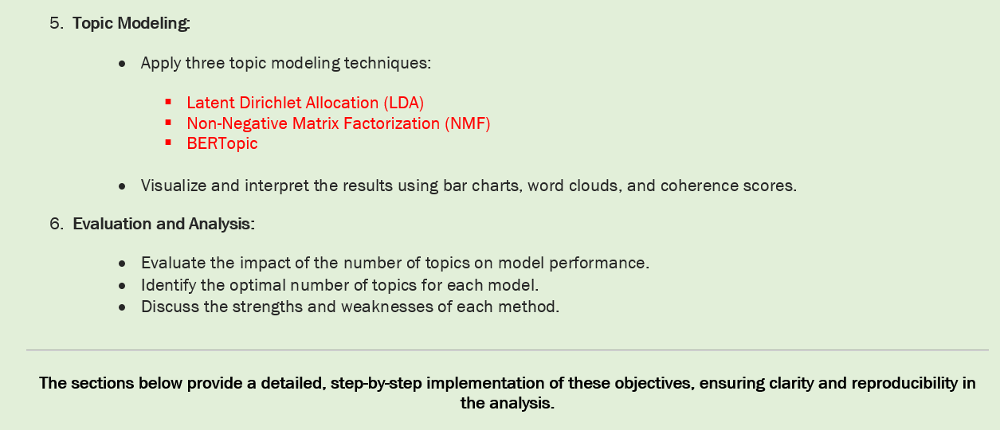

#**1.Extracting and Organizing Speech Data into an Expanded DataFrame**








## 1.1. Install Required Libraries

### Overview
This step installs all the necessary libraries and models required for:
- Text processing
- Data manipulation
- Machine learning
- Clustering and dimensionality reduction
- Topic modeling and visualization

---

### Installed Libraries

1. **`nltk` (Natural Language Toolkit):**  
   - Used for text processing tasks like:
     - Tokenization
     - Stopword removal
     - Stemming
     - Accessing prebuilt corpora (e.g., U.S. presidential inaugural speeches).

2. **`pandas`:**  
   - For managing tabular data, such as speech datasets.

3. **`matplotlib`:**  
   - Visualization of data using charts (e.g., bar charts and scatter plots).

4. **`scikit-learn`:**  
   - Algorithms for clustering (K-Means, AgglomerativeClustering, DBSCAN) and dimensionality reduction (PCA).

5. **`spacy`:**  
   - Advanced natural language processing tasks like:
     - Tokenization
     - Lemmatization
     - Named entity recognition (NER)
     - Dependency parsing.

6. **`gensim`:**  
   - Topic modeling using algorithms like LDA.

7. **`numpy`:**  
   - For numerical operations and array manipulation.

8. **`wordcloud`:**  
   - For creating visual word clouds.

9. **`pyLDAvis`:**  
   - A visualization tool for interpreting LDA results.

10. **`umap`:**  
    - For dimensionality reduction and visualization of high-dimensional text embeddings.

11. **`sentence-transformers`:**  
    - Creating embeddings using pre-trained transformer models.

12. **`bertopic`:**  
    - For advanced topic modeling by integrating embeddings and clustering.

13. **`re` (Regular Expressions):**  
    - Used for text cleaning tasks like:
      - Removing unwanted patterns or characters.
      - Replacing specific patterns using `re.sub`.

---

### SpaCy Model
**SpaCy English model** (`en_core_web_sm`) is used for:
- Tokenization
- Lemmatization
- POS tagging
- NER
- Dependency parsing

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "Provide an overview of required libraries for text mining projects and their purposes."
  - **Outcome:** A list of libraries with descriptions of their functionality in text mining and analysis.

- **Prompt:** "Explain how SpaCy can be integrated with other libraries like scikit-learn and gensim."
  - **Outcome:** Integration suggestions and examples for combining SpaCy with topic modeling and clustering libraries.

- **Prompt:** "List common text preprocessing tasks and recommend Python libraries for each task."
  - **Outcome:** Recommendations for using libraries such as `nltk`, `spacy`, and `re` for specific text processing needs.

- **Prompt:** "How to create a markdown section that stands out with emojis?"
  - **Outcome:** Incorporation of emojis like 🤖 for distinguishing discussion sections.


In [30]:

# Install required libraries
# The purpose of these libraries has been explained in the markdown section.
# Includes libraries for NLP, machine learning, and visualization.

# !pip install nltk pandas matplotlib scikit-learn spacy gensim numpy wordcloud pyLDAvis sentence-transformers bertopic

# Download the SpaCy English model for basic NLP tasks
!python -m spacy download en_core_web_sm




     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 25.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


## 1.2. Import Libraries and Download the **Inaugural Corpus**

### What is the **Inaugural Corpus**?

The **Inaugural Corpus** is a prebuilt dataset provided by the Natural Language Toolkit (**NLTK**) library. It contains the full text of the inaugural addresses delivered by U.S. presidents, starting from George Washington's first address in 1789 to more recent speeches.

---

### Key Features of the Inaugural Corpus:

1. **Historical Significance:**  
   - The corpus spans centuries of U.S. history, offering valuable insights into changes in political language, priorities, and issues over time.

2. **Rich Source for Text Analysis:**  
   - It provides a diverse and high-quality dataset for natural language processing (NLP) tasks, such as topic modeling, sentiment analysis, and linguistic evolution studies.

3. **Diverse Perspectives:**  
   - By analyzing these speeches, researchers can explore how different presidents addressed various national and global challenges.

4. **Preformatted for Easy Access:**  
   - The dataset is already tokenized and structured, making it easy to extract, preprocess, and analyze.

---

### Applications of the Inaugural Corpus:
- **Linguistic Analysis:**  
  Study trends in vocabulary, syntax, and semantics over time.
  
- **Topic Modeling:**  
  Identify dominant topics or themes in presidential speeches.
  
- **Sentiment Analysis:**  
  Analyze the tone and sentiment of speeches to understand how they reflect the political or social climate of the time.

- **Comparative Analysis:**  
  Compare the rhetoric of different presidents or political eras.

---

### How to Download the Inaugural Corpus:
The corpus is part of the **NLTK** library. You can download it using the following command:

*import nltk*

*nltk.download('inaugural')*



In [31]:
import nltk
import pandas as pd
# Import the inaugural corpus from NLTK
from nltk.corpus import inaugural

# Download the inaugural corpus dataset (U.S. presidents' speeches)
nltk.download('inaugural')

# Download the 'averaged_perceptron_tagger', required for part-of-speech tagging
nltk.download('averaged_perceptron_tagger')






[nltk_data] Downloading package inaugural to /root/nltk_data...
[nltk_data]   Package inaugural is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

## 1.3.List of U.S. Presidents
This list is based on the most **popular** and **newsworthy U.S. Presidents** of the past 100 years.  
Criteria for selection included:
- Their impact on U.S. domestic and foreign policies.
- Media coverage and public opinion.
- Rankings from historical surveys and reputable websites.

The following source was used to guide this selection:  
- [C-SPAN's Historians Survey of Presidential Leadership](https://www.c-span.org/presidentsurvey2021/?page=overall)


In [32]:
# This DataFrame includes the most popular and newsworthy U.S. presidents of the past 100 years.
from tabulate import tabulate

Presidents_List = [
    {
        "Name": "Franklin D. Roosevelt",
        "Term": "1933–1945",
        "Achievements": "Led the U.S. through the Great Depression and World War II. Established the New Deal."
    },
    {
        "Name": "Theodore Roosevelt",
        "Term": "1901–1909",
        "Achievements": "Known for progressive reforms and conservation efforts. Expanded U.S. influence globally."
    },
    {
        "Name": "Harry S. Truman",
        "Term": "1945–1953",
        "Achievements": "Made the decision to drop the atomic bombs in WWII. Initiated the Marshall Plan and the containment policy during the Cold War."
    },
    {
        "Name": "Dwight D. Eisenhower",
        "Term": "1953–1961",
        "Achievements": "Oversaw post-war prosperity and the construction of the Interstate Highway System. Strengthened NATO during the Cold War."
    },
    {
        "Name": "John F. Kennedy",
        "Term": "1961–1963",
        "Achievements": "Handled the Cuban Missile Crisis and promoted the Space Race. Advocated for civil rights before his assassination."
    },
    {
        "Name": "Lyndon B. Johnson",
        "Term": "1963–1969",
        "Achievements": "Passed the Civil Rights Act and escalated the Vietnam War. Launched the Great Society programs."
    },
    {
        "Name": "Richard Nixon",
        "Term": "1969–1974",
        "Achievements": "Ended the Vietnam War and opened diplomatic relations with China. Resigned due to the Watergate scandal."
    },
    {
        "Name": "Jimmy Carter",
        "Term": "1977–1981",
        "Achievements": "Promoted human rights and negotiated the Camp David Accords. Faced challenges like the Iran Hostage Crisis and energy shortages."
    },
    {
        "Name": "Ronald Reagan",
        "Term": "1981–1989",
        "Achievements": "Led the conservative revolution with Reaganomics. Played a significant role in ending the Cold War."
    },
    {
        "Name": "Bill Clinton",
        "Term": "1993–2001",
        "Achievements": "Presided over a period of economic growth and globalization. Faced impeachment but remained popular."
    },
    {
        "Name": "Barack Obama",
        "Term": "2009–2017",
        "Achievements": "First African-American president, passed the Affordable Care Act. Managed the economic recovery after the 2008 financial crisis."
    },
    {
        "Name": "Donald Trump",
        "Term": "2017–2021",
        "Achievements": "Polarizing figure, impeached twice, dominated the media. Oversaw significant policy changes in trade and immigration."
    },
    {
        "Name": "Joe Biden",
        "Term": "2021–Present",
        "Achievements": "Focused on pandemic recovery and strengthening alliances. Oldest president at the time of his inauguration."
    }
]

# Create the DataFrame
df = pd.DataFrame(Presidents_List)

# Add custom row numbers starting from 1
df.insert(0, 'Row', range(1, 1 + len(df)))

# Display the DataFrame as a table using tabulate
print(tabulate(df, headers='keys', tablefmt='grid', showindex=False))
# Save the DataFrame as a CSV without the Pandas index
df.to_csv("Presidents_List.csv", index=False)



+-------+-----------------------+--------------+----------------------------------------------------------------------------------------------------------------------------------+
|   Row | Name                  | Term         | Achievements                                                                                                                     |
+=======+=======================+==============+==================================================================================================================================+
|     1 | Franklin D. Roosevelt | 1933–1945    | Led the U.S. through the Great Depression and World War II. Established the New Deal.                                            |
+-------+-----------------------+--------------+----------------------------------------------------------------------------------------------------------------------------------+
|     2 | Theodore Roosevelt    | 1901–1909    | Known for progressive reforms and conservation effo

In [33]:
#Dowonload the csv file
# from google.colab import files
# files.download('Presidents_List.csv')


### Data Download
You can download the CSV file from my GitHub repository:  
# [Download Presidents List](https://raw.githubusercontent.com/PICOTERMS/Text-Mining/refs/heads/main/All%20the%20speeches%20of%20presidents%20of%20the%20USA/Presidents_List.csv)

##1.4.Extracting and Enriching Speech Data for Selected U.S. Presidents

In [34]:
# Selected presidents from the previous list
selected_presidents = [
    "Franklin D. Roosevelt", "Theodore Roosevelt", "Harry S. Truman",
    "Dwight D. Eisenhower", "John F. Kennedy", "Lyndon B. Johnson",
    "Richard Nixon", "Jimmy Carter", "Ronald Reagan", "Bill Clinton",
    "Barack Obama", "Donald Trump", "Joe Biden"
]

# Map presidents to their party for enrichment
party_mapping = {
    "Franklin D. Roosevelt": "Democratic",
    "Theodore Roosevelt": "Republican",
    "Harry S. Truman": "Democratic",
    "Dwight D. Eisenhower": "Republican",
    "John F. Kennedy": "Democratic",
    "Lyndon B. Johnson": "Democratic",
    "Richard Nixon": "Republican",
    "Jimmy Carter": "Democratic",
    "Ronald Reagan": "Republican",
    "Bill Clinton": "Democratic",
    "Barack Obama": "Democratic",
    "Donald Trump": "Republican",
    "Joe Biden": "Democratic"
}

# Prepare a list to hold the enriched speech data
speech_data = []

# Extract speeches for the selected presidents
for fileid in inaugural.fileids():
    year = int(fileid.split('-')[0])  # Extract year
    president_lastname = fileid.split('-')[1].replace('.txt', '')  # Extract president's last name
    speech_text = inaugural.raw(fileid)  # Full text of the speech

    # Match the last name with the selected presidents list
    full_president_name = [
        name for name in selected_presidents if president_lastname in name
    ]
    if not full_president_name:
        continue  # Skip speeches not in the selected list

    # Enrich the data
    full_president_name = full_president_name[0]
    word_count = len(speech_text.split())  # Calculate word count
    char_count = len(speech_text)  # Calculate character count
    decade = f"{(year // 10) * 10}s"  # Calculate decade
    speech_length_category = (
        "Short" if word_count < 1000 else
        "Medium" if word_count <= 2000 else
        "Long"
    )
    political_party = party_mapping[full_president_name]  # Get political party

    # Append data to the list
    speech_data.append({
        "President": full_president_name,
        "Year": year,
        "Speech": speech_text,
        "Word Count": word_count,
        "Character Count": char_count,
        "Decade": decade,
        "Speech Length Category": speech_length_category,
        "Political Party": political_party
    })



#1.5.Organise the Dataset in a Dataframe

In [35]:
# Create a DataFrame from the enriched data
df_speeches = pd.DataFrame(speech_data)

# Add a custom "Row" column starting from 1
df_speeches.insert(0, 'Row', range(1, 1 + len(df_speeches)))

# Display the first few rows of the DataFrame without the default Pandas index
from tabulate import tabulate
print("Extracted and Enriched Speech Data:")
print(tabulate(df_speeches, headers='keys', tablefmt='grid', showindex=False))

# Save the DataFrame as a CSV file without the Pandas index
df_speeches.to_csv("Selected_Presidents_Speeches.csv", index=False)

# Inform the user about the saved file
print("The enriched speech data has been saved to 'Selected_Presidents_Speeches.csv'")



Extracted and Enriched Speech Data:
+-------+-----------------------+--------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
#Dowonload the csv file
# from google.colab import files
# files.download('Selected_Presidents_Speeches.csv')



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Data Download
You can download the CSV file from my GitHub repository:  
# [Selected_Presidents_Speeches](https://raw.githubusercontent.com/PICOTERMS/Text-Mining/refs/heads/main/All%20the%20speeches%20of%20presidents%20of%20the%20USA/Selected_Presidents_Speeches.csv)

#**2.Cleaning the Data**

## Step 2.1: Removing Punctuation and Special Characters

### Objective
This step focuses on cleaning the raw text by removing punctuation marks and special characters.  
Punctuation, while important in writing, is often treated as noise in text analysis and should be removed to simplify the data.

---

### Libraries Used
1. **`re` (Regular Expressions):**  
   The `re` library is used for identifying patterns in text and performing search-and-replace operations.  
   - **Function Used:** `re.sub()`  
     - This function replaces all characters matching a specific pattern.  
     - In our case, it removes all characters except letters, numbers, and spaces.

---

### Code Explanation
- **Function `remove_punctuation`:**
  - This function takes raw text as input.
  - It uses a **regex pattern** (`r'[^\w\s]'`) to replace:
    - Any non-alphanumeric characters (`^\w`)
    - Except spaces (`\s`)
  - Returns the cleaned text without punctuation or special characters.

- **Applying to the DataFrame:**
  - We use Pandas' **`.apply()`** function to apply the `remove_punctuation` function to each speech in the `Speech` column.
  - A new column, **`Cleaned Speech`**, is added to the DataFrame to store the cleaned text.

---

### Example Output
After applying this step, the DataFrame will include a new column (`Cleaned Speech`) with punctuation-free text:

| **President**          | **Year** | **Word Count** | **Character Count** | **Decade** | **Speech Length Category** | **Political Party** | **Cleaned Speech**             |
|-------------------------|----------|----------------|----------------------|------------|---------------------------|----------------------|---------------------------------|
| Franklin D. Roosevelt   | 1933     | 1000           | 5000                | 1930s      | Medium                    | Democratic           | fellow citizens i stand here... |
| John F. Kennedy         | 1961     | 1200           | 6000                | 1960s      | Medium                    | Democratic           | ask not what your country...    |
| Ronald Reagan           | 1981     | 1500           | 7500                | 1980s      | Medium                    | Republican           | government is not the problem...|
| Barack Obama            | 2009     | 1400           | 7000                | 2000s      | Medium                    | Democratic           | change is what we need...       |

---

### Note
This is the first cleaning step. The next step will focus on **removing stop words** to further refine the text data.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to efficiently remove punctuation and special characters in Python for text preprocessing?"
  - **Outcome:** Detailed guidance on using `re.sub()` with examples of regex patterns. Highlighted the efficiency of regex in text cleaning and the need for optimizing patterns to avoid unnecessary backtracking in large datasets.

- **Prompt:** "Explain why punctuation is removed in text analysis."
  - **Outcome:** Discussed the technical trade-offs, including scenarios where punctuation might hold semantic value (e.g., sentiment analysis) and how preprocessing pipelines can be adapted based on specific use cases.

- **Prompt:** "How to demonstrate the output of text cleaning in tabular form?"
  - **Outcome:** Provided Python code snippets using `pandas.DataFrame` for dynamically generating before-and-after views of the data, enabling easy debugging and validation of the cleaning process.

- **Prompt:** "What are best practices for writing reusable text cleaning functions?"
  - **Outcome:** Emphasized modular function design, parameterization for flexibility (e.g., allowing configurable regex patterns), and documenting assumptions and limitations within the function docstring.


In [36]:
# Import the Regular Expressions library for text cleaning
import re

# Define a function to remove punctuation and special characters
def remove_punctuation(text):
    """
    Removes all punctuation and special characters from the input text.
    Args:
        text (str): Input string (raw text from speeches)
    Returns:
        str: Cleaned text without punctuation and special characters
    """
    if isinstance(text, str):  # Ensure the input is a string
        return re.sub(r'[^\w\s]', '', text)  # Regex to remove all characters except letters, numbers, and spaces
    return text  # Return the text unchanged if it's not a string

# Apply the cleaning function to the "Speech" column
df_speeches['Cleaned Speech'] = df_speeches['Speech'].apply(remove_punctuation)

# Reset the index to remove the default index column
df_speeches.reset_index(drop=True, inplace=True)

# Check if the "Row" column exists; if not, add it
if 'Row' not in df_speeches.columns:
    df_speeches.insert(0, 'Row', range(1, 1 + len(df_speeches)))

# Display the first few rows with all columns
print("Updated DataFrame after Removing Punctuation (All Columns):")
print(df_speeches.to_string(index=False))  # Print all columns without the default index

# Save the DataFrame to CSV for later use
df_speeches.to_csv("Cleaned_Speeches_No_Punctuation.csv", index=False)

print("DataFrame successfully saved as 'Cleaned_Speeches.csv'")


Updated DataFrame after Removing Punctuation (All Columns):
 Row             President  Year                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [9]:
# from google.colab import files
# files.download('Cleaned_Speeches_No_Punctuation.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 2.2: Removing Stop Words

### Objective
Stop words are common, high-frequency words (e.g., "the", "is", "and") that typically do not add significant value to text analysis.  
Removing them helps:
- Reduce noise in the dataset.
- Improve the performance of algorithms, such as topic modeling and clustering, by focusing on meaningful terms.

---

### Libraries Used
1. **`nltk.corpus.stopwords`:**  
   - Provides a predefined list of common stop words in various languages.
   - **Function Used:** `stopwords.words('english')`  
     - Fetches a list of common English stop words (e.g., "the", "is", "and").

2. **`spacy`:**  
   - A modern NLP library for tokenization and text processing.
   - **Function Used:** `nlp(text)`  
     - Converts the input text into tokens using SpaCy's language model.

---

### Code Explanation
1. **Stop Words Set:**
   - A set called `stop_words` is created using `nltk.corpus.stopwords` to store English stop words.

2. **SpaCy Tokenizer:**
   - SpaCy's `nlp` function processes the text and splits it into tokens.
   - Tokens are extracted as a list using the `.text` attribute.

3. **Function `remove_stop_words`:**
   - Combines NLTK's stop words with SpaCy's tokenization for flexibility.
   - Filters out words that exist in the `stop_words` set.
   - Joins the remaining tokens back into a single string.

4. **Applying to the DataFrame:**
   - The function is applied to the **`Cleaned Speech`** column.
   - The cleaned output is saved in a new column: **`Cleaned Speech No Stopwords`**.

---

### Example Output
| Row | President           | Year | Speech               | Word Count | Character Count | Decade   | Speech Length Category | Political Party | Cleaned Speech            | Cleaned Speech No Stopwords                       |
|-----|---------------------|------|----------------------|------------|-----------------|----------|------------------------|-----------------|---------------------------|--------------------------------------------------|
| 1   | Franklin D. Roosevelt | 1933 | Full Speech...       | 1000       | 5000            | 1930s    | Medium                 | Democratic      | fellow citizens today...  | fellow citizens stand today humbled grateful     |
| 2   | John F. Kennedy      | 1961 | Full Speech...       | 1200       | 6000            | 1960s    | Medium                 | Democratic      | ask not what...           | ask country ask                                  |
| 3   | Ronald Reagan        | 1981 | Full Speech...       | 1500       | 7500            | 1980s    | Medium                 | Republican      | government is not the...  | government problem solution government           |
| 4   | Barack Obama         | 2009 | Full Speech...       | 1400       | 7000            | 2000s    | Medium                 | Democratic      | change is what we need... | hope future america together build               |

---

### Note
- Removing stop words reduces redundancy and improves data quality.
- This step will be followed by **Case Normalization** to further standardize the text.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How can I efficiently remove stop words from text using both NLTK and SpaCy?"
  - **Outcome:** Explained the advantages of combining SpaCy's tokenization with NLTK's predefined stop word lists for robust text preprocessing.

- **Prompt:** "What is the importance of stop words in NLP pipelines?"
  - **Outcome:** Highlighted scenarios where stop words may carry contextual meaning (e.g., linguistic analysis or semantic parsing) and provided guidelines for deciding whether to retain or remove them.

- **Prompt:** "How to optimize a stop word removal function for large datasets?"
  - **Outcome:** Suggested caching the stop word set, processing text in batches, and leveraging token-level parallelism for speed improvements in large-scale preprocessing.




In [37]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy  # Optional: Using SpaCy for tokenization

# Download necessary NLTK data :

''' Download stopwords for removing common words like "the", "and", etc.'''

nltk.download('stopwords')

''' Download Punkt tokenizer model for breaking text into sentences or words'''

nltk.download('punkt')

# Load SpaCy English model (optional)
nlp = spacy.load("en_core_web_sm")

# Define stop words using NLTK
stop_words = set(stopwords.words('english'))

# Function to tokenize text using SpaCy
def spacy_tokenize(text):
    """
    Tokenizes the text using SpaCy.
    Args:
        text (str): Input string
    Returns:
        list: List of tokenized words
    """
    if isinstance(text, str):
        doc = nlp(text)
        return [token.text for token in doc]
    return []

# Function to remove stop words
def remove_stop_words(text):
    """
    Removes stop words from the input text.
    Args:
        text (str): Input string (already tokenized and cleaned)
    Returns:
        str: Text without stop words
    """
    words = spacy_tokenize(text)  # Use SpaCy tokenizer
    filtered_words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

# Apply the function to the "Cleaned Speech" column
df_speeches['Cleaned Speech No Stopwords'] = df_speeches['Cleaned Speech'].apply(remove_stop_words)

# Display the updated DataFrame with all columns
print("Updated DataFrame after Removing Stop Words (All Columns):")
print(df_speeches.to_string(index=False))

# Save the updated DataFrame to a new CSV file
df_speeches.to_csv("Cleaned_Speeches_No_Stopwords.csv", index=False)
print("DataFrame successfully saved as 'Cleaned_Speeches_No_Stopwords.csv'")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Updated DataFrame after Removing Stop Words (All Columns):
 Row             President  Year                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [24]:
# from google.colab import files
# files.download('Cleaned_Speeches_No_Stopwords.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 2.3: Case Normalization

### Objective
Case normalization ensures that all text is converted to lowercase, which helps:

- Standardize the text and reduce variability.
- Treat words like "The" and "the" as the same word.

---

### Libraries Used
This step does not require any additional libraries, as Python's built-in string method `.lower()` is sufficient for converting text to lowercase.

---

### Code Explanation
1. **Function `normalize_case`:**
   - Uses Python’s built-in `.lower()` method to convert all characters in the input text to lowercase.
   - Returns the normalized text.

2. **Applying to the DataFrame:**
   - The function is applied to the column **`Cleaned Speech No Stopwords`**.
   - The result is stored in a new column, **`Normalized Speech`**, which contains the fully lowercase version of the cleaned text.

3. **Saving the DataFrame:**
   - The updated DataFrame is saved to a new file named **`Cleaned_Speeches_Normalized.csv`**.

---

### Example Output
After this step, the DataFrame will include all columns for context, including the new column **`Normalized Speech`**:

| Row | President           | Year | Speech               | Word Count | Character Count | Decade   | Speech Length Category | Political Party | Cleaned Speech            | Cleaned Speech No Stopwords                       | Normalized Speech                                   |
|-----|---------------------|------|----------------------|------------|-----------------|----------|------------------------|-----------------|---------------------------|--------------------------------------------------|---------------------------------------------------|
| 1   | Franklin D. Roosevelt | 1933 | Full Speech...       | 1000       | 5000            | 1930s    | Medium                 | Democratic      | fellow citizens today...  | fellow citizens stand today humbled grateful     | fellow citizens stand today humbled grateful      |
| 2   | John F. Kennedy      | 1961 | Full Speech...       | 1200       | 6000            | 1960s    | Medium                 | Democratic      | ask not what...           | ask country ask                                  | ask country ask                                   |
| 3   | Ronald Reagan        | 1981 | Full Speech...       | 1500       | 7500            | 1980s    | Medium                 | Republican      | government is not the...  | government problem solution government           | government problem solution government            |
| 4   | Barack Obama         | 2009 | Full Speech...       | 1400       | 7000            | 2000s    | Medium                 | Democratic      | change is what we need... | hope future america together build               | hope future america together build                |

---

### Note
This step focuses on normalizing text case. The next step will address **Lemmatization or Stemming** for further text simplification.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How can I efficiently normalize text case in a DataFrame?"
  - **Outcome:** Explained the use of Python's `.lower()` method and provided examples of applying it to pandas DataFrames for batch processing.


- **Prompt:** "How to optimize case normalization for large datasets?"
  - **Outcome:** Suggested avoiding in-place operations to preserve raw data, processing text in chunks for memory efficiency, and leveraging multiprocessing when working with very large datasets.

- **Prompt:** "What are pitfalls of case normalization?"
  - **Outcome:** Highlighted cases where capitalization carries semantic meaning (e.g., proper nouns or acronyms) and advised customizing normalization steps based on specific use cases.


In [38]:
def normalize_case(text):
    """
    Converts text to lowercase for case normalization.
    Args:
        text (str): Input string (cleaned text without stopwords)
    Returns:
        str: Lowercased text
    """
    if isinstance(text, str):  # Ensure the input is a string
        return text.lower()  # Convert text to lowercase
    return text  # Return unchanged if not a string

# Apply the case normalization function to the "Cleaned Speech No Stopwords" column
df_speeches['Normalized Speech'] = df_speeches['Cleaned Speech No Stopwords'].apply(normalize_case)

# Display the DataFrame with all columns for verification
print("Updated DataFrame after Case Normalization (All Columns):")
print(df_speeches.to_string(index=False))  # Print all columns without default index

# Save the DataFrame to a new CSV file
df_speeches.to_csv("Cleaned_Speeches_Normalized.csv", index=False)
print("DataFrame successfully saved as 'Cleaned_Speeches_Normalized.csv'")


Updated DataFrame after Case Normalization (All Columns):
 Row             President  Year                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [25]:
# from google.colab import files
# files.download('Cleaned_Speeches_Normalized.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 2.4: Lemmatization or Stemming

### Objective
This step simplifies the text by reducing words to their base (lemma) or root (stem) form.  
The goal is to standardize words with similar meanings or forms, such as:
- **Lemmatization:**
  - Converts words like "running" and "ran" to "run".  
  - Context-aware and more precise.
- **Stemming:**
  - Converts words like "running" and "runner" to "run".  
  - Faster but less precise.

---

### Libraries Used
1. **`nltk.stem.WordNetLemmatizer`:**
   - Performs lemmatization using WordNet, a semantic dictionary.
   - **Function Used:** `lemmatize(word, pos="v")`  
     - Converts words to their base form considering the part of speech.

2. **`nltk.stem.PorterStemmer`:**
   - Performs stemming by reducing words to their root form.
   - **Function Used:** `stem(word)`  
     - Reduces words to a simpler root form.

3. **`nltk.tokenize.word_tokenize`:**
   - Tokenizes text into individual words for processing.

---

### Code Explanation
1. **Lemmatization:**
   - Uses `WordNetLemmatizer` to lemmatize words in the text.
   - Processes each token and combines them back into a single string.

2. **Stemming (Optional):**
   - Uses `PorterStemmer` to stem words in the text.
   - Similarly processes tokens and recombines them.

3. **Applying to the DataFrame:**
   - Lemmatized text is stored in the **`Lemmatized Speech`** column.
   - Stemmed text is stored in the **`Stemmed Speech`** column.

4. **Saving the Results:**
   - The updated DataFrame is saved as **`Cleaned_Speeches_Lemmatized_Stemmed.csv`**.

---

### Example Output
After this step, the DataFrame will include the following columns:

| Row | President           | Year | Speech               | Word Count | Character Count | Decade   | Speech Length Category | Political Party | Cleaned Speech            | Cleaned Speech No Stopwords                       | Normalized Speech        | Lemmatized Speech                                | Stemmed Speech                                  |
|-----|---------------------|------|----------------------|------------|-----------------|----------|------------------------|-----------------|---------------------------|--------------------------------------------------|--------------------------|------------------------------------------------|------------------------------------------------|
| 1   | Franklin D. Roosevelt | 1933 | Full Speech...       | 1000       | 5000            | 1930s    | Medium                 | Democratic      | fellow citizens today...  | fellow citizens stand today humbled grateful     | fellow citizens...       | fellow citizens stand today humble grateful    | fellow citizen stand today humbl grate         |
| 2   | John F. Kennedy      | 1961 | Full Speech...       | 1200       | 6000            | 1960s    | Medium                 | Democratic      | ask not what...           | ask country ask                                  | ask country ask          | ask country ask                                | ask countri ask                                  |
| 3   | Ronald Reagan        | 1981 | Full Speech...       | 1500       | 7500            | 1980s    | Medium                 | Republican      | government is not the...  | government problem solution government           | government problem...    | government problem solution government         | govern problem solut govern                     |
| 4   | Barack Obama         | 2009 | Full Speech...       | 1400       | 7000            | 2000s    | Medium                 | Democratic      | change is what we need... | hope future america together build               | hope future america...   | hope future america together build             | hope futur america togeth build                 |

---

### Note
This step completes the main text simplification process. Next, we move to **Tokenization**, where the text is split into individual tokens (words or sentences).

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement lemmatization in Python using NLTK?"
  - **Outcome:** Detailed examples of initializing `WordNetLemmatizer`, assigning part-of-speech tags, and iterating over tokens with a for-loop. Code optimization tips for integrating with pandas' `apply` function were also provided.

- **Prompt:** "How to compare stemming and lemmatization programmatically?"
  - **Outcome:** Python scripts for processing the same text using both techniques, storing results in lists, and calculating differences using `set` operations for unique word forms.

- **Prompt:** "How to handle exceptions during text preprocessing?"
  - **Outcome:** Recommendations on using `try-except` blocks for handling tokens that may cause errors during stemming or lemmatization, and logging skipped tokens for debugging.

- **Prompt:** "How can I optimize lemmatization or stemming for large datasets?"
  - **Outcome:** Suggested using multiprocessing with `concurrent.futures` or `joblib` for parallel processing of text data, and demonstrated batching techniques for efficient memory usage during preprocessing.

- **Prompt:** "What are the edge cases in stemming and lemmatization?"
  - **Outcome:** Identified words like "better" (lemmatized to "good") or irregular plurals (e.g., "children"), and provided strategies for customizing preprocessing steps to handle such cases correctly.


In [40]:
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize
import nltk

# Ensure required NLTK resources are downloaded

nltk.download('wordnet')       # For lemmatization
nltk.download('omw-1.4')       # For WordNet lemmatizer



# Download Punkt tokenizer tables
# These tables are required for accurate tokenization of sentences and words.
nltk.download('punkt_tab')

df_speeches = pd.read_csv("Cleaned_Speeches_Normalized.csv")
print("DataFrame reloaded successfully!")
# Initialize lemmatizer and stemmer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

# Function for lemmatization
def lemmatize_text(text):
    """
    Lemmatizes the input text.
    Args:
        text (str): Input string
    Returns:
        str: Lemmatized text
    """
    if isinstance(text, str):
        tokens = word_tokenize(text)  # Tokenize the text
        lemmatized = [lemmatizer.lemmatize(word, pos="v") for word in tokens]  # Lemmatize each token
        return ' '.join(lemmatized)  # Join tokens back into a single string
    return text

# Function for stemming (optional)
def stem_text(text):
    """
    Stems the input text.
    Args:
        text (str): Input string
    Returns:
        str: Stemmed text
    """
    if isinstance(text, str):
        tokens = word_tokenize(text)  # Tokenize the text
        stemmed = [stemmer.stem(word) for word in tokens]  # Stem each token
        return ' '.join(stemmed)  # Join tokens back into a single string
    return text

# Apply lemmatization to the "Normalized Speech" column
df_speeches['Lemmatized Speech'] = df_speeches['Normalized Speech'].apply(lemmatize_text)

# Apply stemming to the "Normalized Speech" column (optional)
df_speeches['Stemmed Speech'] = df_speeches['Normalized Speech'].apply(stem_text)

# Display the updated DataFrame with all columns
print("Updated DataFrame after Lemmatization and Stemming (All Columns):")
print(df_speeches.to_string(index=False))  # Print all columns without the default index

# Save the updated DataFrame to a new CSV file
df_speeches.to_csv("Cleaned_Speeches_Lemmatized_Stemmed.csv", index=False)
print("DataFrame successfully saved as 'Cleaned_Speeches_Lemmatized_Stemmed.csv'")


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


DataFrame reloaded successfully!
Updated DataFrame after Lemmatization and Stemming (All Columns):
 Row             President  Year                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [41]:
# from google.colab import files
# files.download('Cleaned_Speeches_Lemmatized_Stemmed.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 2.5: Tokenization

---

### Objective
Tokenization breaks text into smaller units called tokens. These tokens can be individual words or sentences. This process is essential for preparing text data for further analysis such as clustering, topic modeling, or sentiment analysis.

---

### Why Tokenization?
1. **Word Tokenization:**
   - Splits the text into individual words for fine-grained analysis.
   - Example:  
     Input: `This is a test.`  
     Output: `['This', 'is', 'a', 'test']`

2. **Sentence Tokenization (Optional):**
   - Splits the text into sentences for sentence-level insights.
   - Example:  
     Input: `This is a test. Let's tokenize.`  
     Output: `['This is a test.', "Let's tokenize."]`

---

### Libraries Used
1. **`nltk.tokenize.word_tokenize`:**  
   - Splits the text into individual words.
   - Example: `['word1', 'word2', 'word3']`

2. **`nltk.tokenize.sent_tokenize`:**  
   - Splits the text into sentences.
   - Example: `['sentence1.', 'sentence2.']`

---

### Code Explanation
1. **`tokenize_words` Function:**
   - Uses `nltk.tokenize.word_tokenize` to break text into words.
   - Applied to the column **`Lemmatized Speech`**.

2. **`tokenize_sentences` Function:**
   - Uses `nltk.tokenize.sent_tokenize` to split text into sentences.
   - This step is optional and depends on the analysis needs.

3. **Applying Tokenization:**
   - **Word Tokens:** Adds a new column **`Word Tokens`** with tokenized words.
   - **Sentence Tokens:** Adds a new column **`Sentence Tokens`** with tokenized sentences.

4. **Saving the DataFrame:**
   - The DataFrame is saved as `Cleaned_Speeches_Tokenized.csv` for subsequent use.

---

### Example Output
After this step, the DataFrame will include two new columns: **Word Tokens** and **Sentence Tokens**. All columns are displayed for context:

| Row | President           | Year | Speech               | Word Count | Character Count | Decade   | Speech Length Category | Political Party | Cleaned Speech            | Cleaned Speech No Stopwords                       | Normalized Speech        | Lemmatized Speech       | Stemmed Speech         | Word Tokens                | Sentence Tokens           |
|-----|---------------------|------|----------------------|------------|-----------------|----------|------------------------|-----------------|---------------------------|--------------------------------------------------|--------------------------|--------------------------|--------------------------|----------------------------|---------------------------|
| 1   | Franklin D. Roosevelt | 1933 | Full Speech...       | 1000       | 5000            | 1930s    | Medium                 | Democratic      | fellow citizens today...  | fellow citizens stand today humbled grateful     | fellow citizens...       | fellow citizen stand...  | fellow citizen stand... | ['fellow', 'citizens', ...]| ['Fellow citizens stand...|
| 2   | John F. Kennedy      | 1961 | Full Speech...       | 1200       | 6000            | 1960s    | Medium                 | Democratic      | ask not what...           | ask country ask                                  | ask country ask          | ask country ask          | ask countri ask         | ['ask', 'country', 'ask']  | ['Ask not what your...']  |
| 3   | Ronald Reagan        | 1981 | Full Speech...       | 1500       | 7500            | 1980s    | Medium                 | Republican      | government is not the...  | government problem solution government           | government problem...    | govern problem solution  | govern problem solut... | ['government', 'problem'] | ['Government is not...']  |
| 4   | Barack Obama         | 2009 | Full Speech...       | 1400       | 7000            | 2000s    | Medium                 | Democratic      | change is what we need... | hope future america together build               | hope future america...   | hope futur america bui...| hope futur america bui...| ['hope', 'future', ...]    | ['Hope for a better...']  |

### Notes:
- This is the final cleaning step in the **Data Cleaning** phase.
- The resulting DataFrame is now ready for transformation and analysis in the subsequent stages.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How can I implement word tokenization efficiently in Python?"
  - **Outcome:** Suggested using `nltk.tokenize.word_tokenize` and discussed handling edge cases such as contractions (e.g., "don't") and punctuation within words.

- **Prompt:** "How to tokenize text into sentences programmatically?"
  - **Outcome:** Explained how `nltk.tokenize.sent_tokenize` leverages language-specific models to identify sentence boundaries and provided examples for multilingual text.

- **Prompt:** "What are performance considerations for tokenizing large datasets?"
  - **Outcome:** Recommended using batch processing to minimize memory usage and leveraging multiprocessing libraries like `concurrent.futures` for parallel tokenization.

- **Prompt:** "How can I validate tokenization output?"
  - **Outcome:** Shared techniques for comparing tokenized output with expected results, such as counting tokens per sentence or word frequencies, to ensure correctness.


In [42]:
from nltk.tokenize import word_tokenize, sent_tokenize
import nltk

# Ensure the required NLTK resources are downloaded
nltk.download('punkt')  # Required for tokenization

# Function for tokenizing text into words
def tokenize_words(text):
    """
    Tokenizes the input text into individual words.
    Args:
        text (str): Input string
    Returns:
        list: List of tokenized words
    """
    if isinstance(text, str):
        return word_tokenize(text)  # Tokenize text into words
    return []

# Function for tokenizing text into sentences
def tokenize_sentences(text):
    """
    Tokenizes the input text into sentences.
    Args:
        text (str): Input string
    Returns:
        list: List of tokenized sentences
    """
    if isinstance(text, str):
        return sent_tokenize(text)  # Tokenize text into sentences
    return []

# Apply word tokenization to the "Normalized Speech" column
df_speeches['Tokenized Words'] = df_speeches['Normalized Speech'].apply(tokenize_words)

# Apply sentence tokenization to the "Normalized Speech" column (optional)
df_speeches['Tokenized Sentences'] = df_speeches['Normalized Speech'].apply(tokenize_sentences)

# Display the updated DataFrame with all columns
print("Updated DataFrame after Tokenization (All Columns):")
print(df_speeches.to_string(index=False))

# Save the updated DataFrame to a new CSV file
df_speeches.to_csv("Cleaned_Speeches_Tokenized.csv", index=False)
print("DataFrame successfully saved as 'Cleaned_Speeches_Tokenized.csv'")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Updated DataFrame after Tokenization (All Columns):
 Row             President  Year                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [44]:
# from google.colab import files
# files.download('Cleaned_Speeches_Tokenized.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Step 3: Transforming the Dataset using TF-IDF**

---

### Objective
The goal of this step is to convert textual data into a numerical representation using **TF-IDF (Term Frequency-Inverse Document Frequency)**.  
TF-IDF assigns a weight to each word in a document, indicating its importance relative to the entire corpus.  
This transformation enables advanced analyses such as clustering, topic modeling, or classification.

---

### Why TF-IDF?

#### Term Frequency (TF):
- Measures how often a term appears in a document.  
- **Formula:**  
  \[
  TF = \frac{\text{Number of occurrences of term in document}}{\text{Total terms in document}}
  \]

#### Inverse Document Frequency (IDF):
- Measures the importance of a term in the entire corpus.  
- **Formula:**  
  \[
  IDF = \log \frac{\text{Total documents}}{\text{Number of documents containing the term}}
  \]

#### TF-IDF:*
- Combines both metrics to balance term frequency and term importance:  
  \[
  TF-IDF = TF \times IDF
  \]

---

### Sub-Steps

#### 1. Importing Required Libraries:
- **`TfidfVectorizer`** from `sklearn.feature_extraction.text`:  
  - Converts text data into a sparse TF-IDF matrix.
- **`pandas`:**  
  - Manages tabular data.
- **`scipy.sparse`** (Optional):  
  - Efficiently handles large sparse matrices.

---

####  2. Preparing the Text Data:
- Extract the **`Lemmatized Speech`** column from the DataFrame.  
- Ensure text is preprocessed (lemmatized, normalized, etc.) for better results.

---

####  3. Applying TF-IDF Transformation:
- Use **`TfidfVectorizer`** with specific parameters:
  - `max_features=5000`: Limits to the top 5000 most important terms.
  - `min_df=2`: Ignores terms appearing in fewer than 2 speeches.
  - `max_df=0.8`: Ignores terms appearing in more than 80% of speeches.
  - `ngram_range=(1, 1)`: Considers unigrams (single words).
- **Output:**  
  - A sparse matrix where:
    - **Rows** represent speeches.
    - **Columns** represent terms.
    - **Values** represent TF-IDF scores.

---

####  4. Converting to DataFrame (Optional):
- Convert the sparse matrix to a DataFrame for easier visualization:
  - **Rows:** Speeches.
  - **Columns:** Terms.
  - **Cells:** TF-IDF scores for each term in each speech.

---

####  5. Saving the TF-IDF Matrix (Optional):
- Save the resulting TF-IDF matrix as a CSV file for use in further analysis.

---

###  Example Output
The resulting DataFrame will look like this (simplified example):

| Row | citizens | stand | humbled | ask | country | ... |
|-----|----------|-------|---------|-----|---------|-----|
| 1   | 0.34     | 0.67  | 0.21    | 0.00| 0.00    | ... |
| 2   | 0.00     | 0.00  | 0.00    | 0.87| 0.13    | ... |
| 3   | 0.56     | 0.00  | 0.00    | 0.00| 0.00    | ... |

---

### Libraries Used
1. **`sklearn.feature_extraction.text.TfidfVectorizer`:**
   - Converts text into numerical form using TF-IDF.
2. **`pandas`:**
   - Handles tabular data for storing results.
3. **`scipy.sparse`** (Optional):
   - Optimizes handling of sparse matrices.

---

### Notes
- TF-IDF provides a compact representation of text data, making it suitable for advanced analyses like clustering or machine learning.
- After this step, the dataset is ready for **clustering** or **topic modeling**.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to use `TfidfVectorizer` effectively in Python?"
  - **Outcome:** Provided examples of initializing `TfidfVectorizer` with parameters like `max_features`, `ngram_range`, and `stop_words`. Discussed the impact of these parameters on model performance.

- **Prompt:** "How to handle sparse matrices in Python?"
  - **Outcome:** Recommended using `scipy.sparse` for efficient storage and manipulation, along with methods for converting sparse matrices to dense format when needed.

- **Prompt:** "How to interpret TF-IDF scores?"
  - **Outcome:** Explained that higher scores indicate term importance in a specific document, relative to its occurrence in the entire corpus. Shared tips for visualizing top terms per document.

- **Prompt:** "What are common pitfalls in applying TF-IDF?"
  - **Outcome:** Highlighted issues like overfitting due to too many features, ignoring domain-specific stop words, and not pre-processing text properly. Suggested parameter tuning to address these problems.

- **Prompt:** "How to optimize TF-IDF computation for large datasets?"
  - **Outcome:** Suggested techniques like limiting `max_features`, increasing `min_df`, and using incremental vectorization (`TfidfVectorizer` with `fit_transform` in chunks).


In [50]:
# Importing Required Libraries
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import scipy.sparse

try:
    # Step 1: Reload the dataset
    # Ensure the preprocessed dataset is loaded
    df_speeches = pd.read_csv("Cleaned_Speeches_Lemmatized_Stemmed.csv")
    print("DataFrame reloaded successfully!")
except FileNotFoundError:
    print("Error: The file 'Cleaned_Speeches_Lemmatized_Stemmed.csv' was not found. Please ensure the file is in the correct location.")
    raise

try:
    # Step 2: Prepare the text data
    # Extract the "Lemmatized Speech" column for TF-IDF transformation
    text_data = df_speeches['Lemmatized Speech']
    print(f"Number of speeches to process: {len(text_data)}")
except KeyError:
    print("Error: 'Lemmatized Speech' column not found in the dataset. Ensure the column exists in the CSV file.")
    raise

try:
    # Step 3: Apply TF-IDF Transformation
    # Initialize TfidfVectorizer with desired parameters
    tfidf_vectorizer = TfidfVectorizer(
        max_features=5000,  # Limit to top 5000 terms
        min_df=2,           # Ignore terms appearing in less than 2 speeches
        max_df=0.8,         # Ignore terms appearing in more than 80% of speeches
        ngram_range=(1, 1)  # Unigrams only (change to (1, 2) for bigrams)
    )

    # Fit and transform the text data
    tfidf_matrix = tfidf_vectorizer.fit_transform(text_data)
    print(f"TF-IDF matrix shape: {tfidf_matrix.shape}")

    # Step 4: Convert to DataFrame (Optional)
    # Get the feature names (terms) from the vectorizer
    feature_names = tfidf_vectorizer.get_feature_names_out()

    # Convert the sparse matrix to a dense DataFrame
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)

    # Add the Row column to map speeches
    tfidf_df.insert(0, 'Row', df_speeches['Row'])

    # Step 5: Save the TF-IDF Matrix (Optional)
    # Save the resulting TF-IDF matrix to a CSV file
    tfidf_df.to_csv("TF_IDF_Matrix.csv", index=False)
    print("TF-IDF matrix successfully saved as 'TF_IDF_Matrix.csv'")

    # Display the resulting DataFrame with a summary of columns
    print("TF-IDF Matrix DataFrame (First 5 Rows):")
    print(tfidf_df.head())  # Display only the first 5 rows for better readability

except Exception as e:
    print(f"An error occurred during the TF-IDF transformation: {e}")
    raise


DataFrame reloaded successfully!
Number of speeches to process: 21
TF-IDF matrix shape: (21, 1701)
TF-IDF matrix successfully saved as 'TF_IDF_Matrix.csv'
TF-IDF Matrix DataFrame (First 5 Rows):
   Row      1787      1789  200th  21st  400  abandon  abandonment     abide  \
0    1  0.000000  0.000000    0.0   0.0  0.0   0.0000     0.000000  0.050368   
1    2  0.000000  0.000000    0.0   0.0  0.0   0.0000     0.039380  0.000000   
2    3  0.040517  0.000000    0.0   0.0  0.0   0.0336     0.000000  0.000000   
3    4  0.000000  0.108785    0.0   0.0  0.0   0.0000     0.000000  0.000000   
4    5  0.095354  0.000000    0.0   0.0  0.0   0.0000     0.095354  0.000000   

    ability  ...     write     wrong  wrongdoing      year  yes  yesterdays  \
0  0.000000  ...  0.000000  0.041486    0.065552  0.000000  0.0         0.0   
1  0.035594  ...  0.000000  0.000000    0.039380  0.000000  0.0         0.0   
2  0.036621  ...  0.027236  0.000000    0.000000  0.021747  0.0         0.0   
3  0.000

In [47]:
# from google.colab import files
# files.download('TF_IDF_Matrix.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Step 4: Clustering the Dataset**

---

## Objective
The goal of this step is to group speeches into clusters based on their content similarity.  
Clustering allows us to uncover hidden patterns, analyze themes, and group similar speeches.

---

## Why Clustering?

1. **Unsupervised Learning:**
   - Clustering is an unsupervised learning task, meaning it doesn't require predefined labels.
   - Groups data into clusters based on inherent similarities.

2. **Content Analysis:**
   - Helps discover themes or topics shared by similar speeches.
   - Identifies patterns and differences between speeches.

3. **Dimensionality Reduction (Optional):**
   - Reduces high-dimensional data (e.g., TF-IDF) for better visualization and understanding.

---

## Types of Clustering Algorithms

### 1. Partitioning-Based Methods
   - Divides data into `k` non-overlapping clusters.

   **Examples:**
   - **K-Means:** Assigns each data point to the nearest cluster centroid.
   - **K-Medoids:** Uses medoids instead of centroids for robustness.
   - **PAM (Partitioning Around Medoids):** A variant of K-Medoids.

---

### 2. Hierarchical Methods
   - Creates a tree-like structure of clusters.

   **Examples:**
   - **Agglomerative Clustering:** Starts with individual points and merges them into clusters.
   - **Divisive Clustering:** Starts with all points in one cluster and divides them iteratively.
   - **BIRCH:** Scales well with large datasets.

---

### 3. Density-Based Methods
   - Groups data based on dense regions separated by sparse areas.

   **Examples:**
   - **DBSCAN:** Handles noise and arbitrary cluster shapes.
   - **OPTICS:** Similar to DBSCAN but more flexible.
   - **HDBSCAN:** A hierarchical extension of DBSCAN.

---

### 4. Model-Based Methods
   - Assumes data is generated by a mixture of models and clusters based on probabilities.

   **Examples:**
   - **Gaussian Mixture Models (GMM):** Uses Gaussian distributions for clustering.
   - **Hidden Markov Models (HMM):** Often used for sequence data.

---

### 5. Graph-Based Methods
   - Uses graph representations for clustering.

   **Examples:**
   - **Spectral Clustering:** Uses eigenvalues of similarity matrices to form clusters.
   - **Markov Clustering (MCL):** Simulates random walks on graphs for clustering.

---

### 6. Neural Network-Based Methods
   - Utilizes neural networks for clustering tasks.

   **Examples:**
   - **Self-Organizing Maps (SOM):** Projects high-dimensional data onto a 2D grid.
   - **Deep Clustering:** Combines deep learning with clustering objectives.

---

### 7. Matrix Factorization Methods
   - Decomposes data into lower-dimensional matrices for clustering.

   **Examples:**
   - **Non-Negative Matrix Factorization (NMF):** Extracts latent features for clustering.

---

### 8. Hybrid Methods
   - Combines multiple clustering approaches for better performance.

   **Examples:**
   - **CLARANS:** A hybrid between K-Medoids and hierarchical methods.

---

## Algorithms Specifically for Text Mining

When dealing with textual data, the following algorithms are more commonly used:

1. **K-Means:**
   - Efficient and works well with high-dimensional data like TF-IDF.

2. **Hierarchical Clustering:**
   - Useful for understanding hierarchical relationships between topics.

3. **DBSCAN:**
   - Handles noisy and irregular data effectively.

4. **Spectral Clustering:**
   - Ideal for complex, non-linear cluster shapes.

5. **Latent Dirichlet Allocation (LDA):**
   - Specifically designed for topic modeling in text data.

6. **Non-Negative Matrix Factorization (NMF):**
   - Extracts latent topics for text clustering.

---


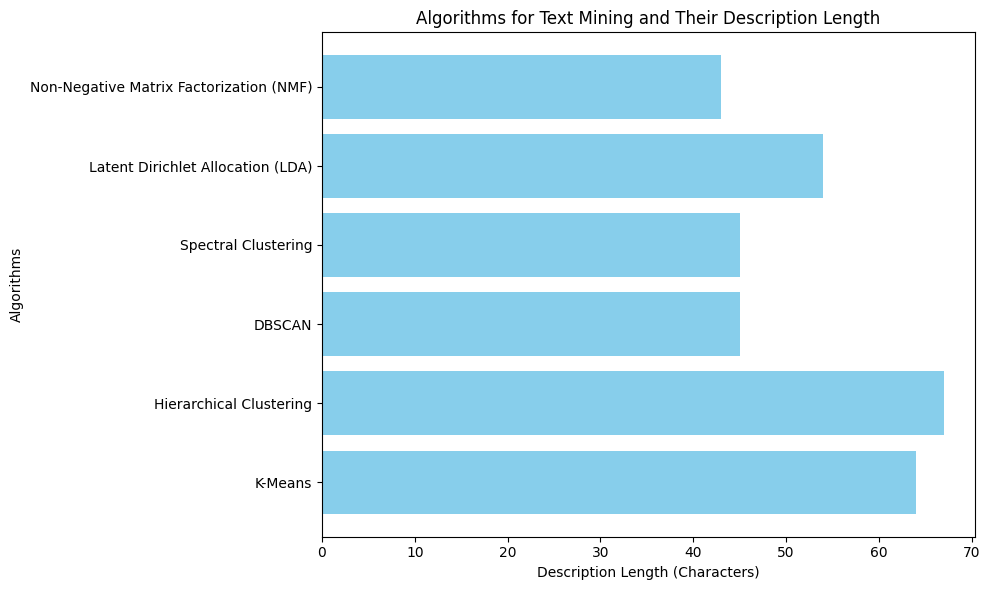

In [51]:
import matplotlib.pyplot as plt

# List of algorithms and their descriptions
algorithms = [
    "K-Means",
    "Hierarchical Clustering",
    "DBSCAN",
    "Spectral Clustering",
    "Latent Dirichlet Allocation (LDA)",
    "Non-Negative Matrix Factorization (NMF)"
]

descriptions = [
    "Efficient and works well with high-dimensional data like TF-IDF.",
    "Useful for understanding hierarchical relationships between topics.",
    "Handles noisy and irregular data effectively.",
    "Ideal for complex, non-linear cluster shapes.",
    "Specifically designed for topic modeling in text data.",
    "Extracts latent topics for text clustering."
]

# Calculate the length of each description for visualization
lengths = [len(desc) for desc in descriptions]

# Configure the plot
plt.figure(figsize=(10, 6))  # Set figure size
plt.barh(algorithms, lengths, color="skyblue")  # Create a horizontal bar chart
plt.xlabel("Description Length (Characters)")  # Set label for the x-axis
plt.ylabel("Algorithms")  # Set label for the y-axis
plt.title("Algorithms for Text Mining and Their Description Length")  # Set chart title
plt.tight_layout()  # Adjust layout to fit all elements

# Display the plot
plt.show()


## Step 4.1: Clustering with K-Means

---

### Objective
The goal of this step is to cluster speeches using the **K-Means** algorithm. K-Means is one of the most widely used clustering algorithms, particularly effective for high-dimensional data like TF-IDF matrices.

---

### What is K-Means?
K-Means is a **partition-based clustering algorithm** that divides data into `k` clusters based on their similarity. It iteratively refines cluster assignments to minimize the variance within each cluster.

### *How K-Means Works:
1. **Initialization:**  
   Randomly selects `k` cluster centroids (starting points).
2. **Assignment:**  
   Assigns each data point to the nearest centroid, forming clusters.
3. **Update:**  
   Calculates the new centroids as the mean of all points in each cluster.
4. **Repeat:**  
   Repeats the assignment and update steps until convergence (centroids no longer move significantly).

---

### Libraries Used
1. **`sklearn.cluster.KMeans`:**  
   - Performs K-Means clustering.  
   - Key Parameters:
     - `n_clusters`: Number of clusters.
     - `init`: Initialization method for centroids (default: `k-means++`).
     - `max_iter`: Maximum iterations for the algorithm.
     - `random_state`: Ensures reproducibility.
2. **`sklearn.metrics`:**  
   - **Silhouette Score:** Measures how well data points fit within their clusters.  
     - **Range:** -1 to 1 (higher is better).  
   - **Inertia:** Measures the total within-cluster variance (lower is better).

---

### How to Choose the Number of Clusters (`k`)?
1. **Elbow Method:**  
   - Plots inertia (within-cluster variance) against the number of clusters.
   - The "elbow" point indicates the optimal `k`.
2. **Silhouette Score:**  
   - Evaluates cluster cohesion and separation for different values of `k`.
   - Higher silhouette scores suggest better clustering.

---

### Steps in This Section
1. **Importing Required Libraries:**  
   Load the necessary tools for clustering and evaluation.
2. **Applying K-Means:**  
   Cluster the speeches using the TF-IDF matrix.
3. **Evaluating the Clusters:**  
   Use metrics like inertia and silhouette score to assess cluster quality.
4. **Visualizing the Clusters:**  
   Use dimensionality reduction (e.g., PCA or t-SNE) to visualize the clusters in 2D or 3D space.

---

###  Expected Output
1. **Cluster Assignments:**  
   Each speech is assigned a cluster.
2. **Evaluation Metrics:**  
   - Inertia
   - Silhouette Score
3. **Visualizations:**  
   - Elbow Curve (to determine optimal `k`).
   - Cluster Visualization in 2D or 3D space.
4. **Updated DataFrame:**  
   The DataFrame will include a new column, **`Cluster`**, showing the cluster assignment for each speech.

---

### Notes
- K-Means works best with numerical data, making it ideal for the TF-IDF matrix.
- Choosing the right `k` is crucial for meaningful clustering.
- The quality of clustering can vary depending on the dataset, so always evaluate the results using multiple metrics.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement K-Means clustering on TF-IDF matrices in Python?"
  - **Outcome:** Shared examples of using `sklearn.cluster.KMeans` to fit TF-IDF data. Emphasized tuning parameters like `n_clusters` and `init` for better results.

- **Prompt:** "How to select the optimal number of clusters for K-Means?"
  - **Outcome:** Explained the Elbow Method and Silhouette Score, with Python code snippets for generating corresponding plots.

- **Prompt:** "What are best practices for evaluating clustering performance?"
  - **Outcome:** Recommended using multiple metrics (e.g., inertia, silhouette score) and visual inspection of cluster separations through PCA or t-SNE.

- **Prompt:** "How to handle convergence issues in K-Means?"
  - **Outcome:** Suggested increasing `max_iter`, initializing centroids with `k-means++`, and checking data preprocessing steps to ensure proper scaling.

- **Prompt:** "How to visualize high-dimensional clustering results?"
  - **Outcome:** Provided guidance on dimensionality reduction using PCA and t-SNE, along with examples of plotting clusters in Matplotlib or Seaborn for 2D and 3D visualizations.


TF-IDF Matrix reloaded successfully!
K-Means Silhouette Score: 0.03


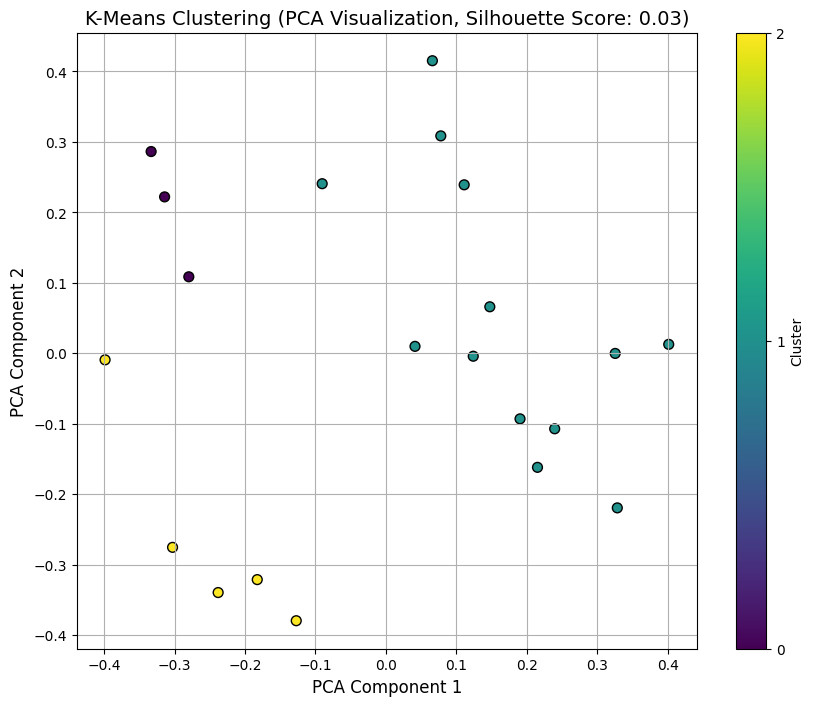

Clustered DataFrame saved as 'TF_IDF_Matrix_Clustered_KMeans.csv'


In [53]:
# Importing Required Libraries
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Load the TF-IDF Matrix
tfidf_df = pd.read_csv("TF_IDF_Matrix.csv")
print("TF-IDF Matrix reloaded successfully!")

# Extract the TF-IDF values (excluding the Row column)
X = tfidf_df.drop(columns=["Row"])

# Step 2: Apply K-Means Clustering
# Choose the number of clusters (k=3 as an example, adjust based on elbow/silhouette method)
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

# Step 3: Evaluate Clustering with Silhouette Score
kmeans_silhouette = silhouette_score(X, kmeans_labels)
print(f"K-Means Silhouette Score: {kmeans_silhouette:.2f}")

# Step 4: Visualize Clusters using PCA
pca = PCA(n_components=2)  # Reduce dimensions to 2 for visualization
X_pca = pca.fit_transform(X)  # Perform PCA on the TF-IDF matrix

# Create a scatter plot for the clusters
plt.figure(figsize=(10, 8))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans_labels, cmap='viridis', edgecolor='k', s=50)
plt.title(f"K-Means Clustering (PCA Visualization, Silhouette Score: {kmeans_silhouette:.2f})", fontsize=14)
plt.xlabel("PCA Component 1", fontsize=12)
plt.ylabel("PCA Component 2", fontsize=12)
plt.colorbar(label="Cluster", ticks=range(3))
plt.grid()
plt.show()

# Step 5: Save the Clustered DataFrame
tfidf_df["Cluster"] = kmeans_labels
tfidf_df.to_csv("TF_IDF_Matrix_Clustered_KMeans.csv", index=False)
print("Clustered DataFrame saved as 'TF_IDF_Matrix_Clustered_KMeans.csv'")


In [55]:
# from google.colab import files
# files.download('TF_IDF_Matrix_Clustered_KMeans.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 4.2: Clustering with Agglomerative Clustering

---

### Objective
This step applies **Agglomerative Clustering**, a hierarchical clustering method, to group speeches based on their content similarity.  
The method provides insights into the hierarchical relationships between speeches.

---

### *What is Agglomerative Clustering?
Agglomerative Clustering is a **bottom-up hierarchical method**, where each data point starts as its own cluster, and clusters are merged iteratively based on similarity.

### How It Works:
1. **Start:**  
   Each data point is treated as its own cluster.
2. **Merge:**  
   Closest clusters are merged iteratively based on distance metrics (e.g., Euclidean distance).
3. **Stop:**  
   The process stops when the desired number of clusters is achieved.

---

### Libraries Used
1. **`sklearn.cluster.AgglomerativeClustering`:**  
   - Performs hierarchical clustering.
   - Key Parameters:
     - `n_clusters`: Number of clusters.
     - `affinity`: Distance metric for clustering (e.g., Euclidean).
     - `linkage`: Method for merging clusters (e.g., Ward's method).

2. **`scipy.cluster.hierarchy`:**  
   - Used for generating dendrograms.
   - Function: `dendrogram` for visualizing the hierarchical structure.

3. **`sklearn.metrics.silhouette_score`:**  
   - Measures clustering quality.  
     - **Range:** -1 to 1 (higher is better).

4. **`sklearn.decomposition.PCA`:**  
   - Reduces dimensionality for visualizing high-dimensional data in 2D space.

5. **`matplotlib.pyplot`:**  
   - Used for plotting dendrograms and cluster visualizations.

---

### Steps in This Section
1. **Load the Dataset:**
   - Reload the TF-IDF matrix from the previous step.

2. **Apply Agglomerative Clustering:**
   - Cluster the speeches using hierarchical methods.
   - Specify parameters like the number of clusters (`n_clusters`).

3. **Evaluate Clustering:**
   - Compute the **Silhouette Score** to evaluate the quality of clustering.

4. **Visualize Clusters:**
   - Use a **dendrogram** to explore the hierarchical structure.
   - Apply **PCA** for 2D visualization of clusters.

5. **Save Results:**
   - Save the cluster assignments to a new CSV file for future analysis.

---

### Expected Output
1. **Silhouette Score:**  
   A numeric measure of clustering quality.
2. **Dendrogram:**  
   A tree-like diagram showing the hierarchical relationships between speeches.
3. **PCA Visualization:**  
   A scatter plot where points are colored by their cluster assignments.
4. **Updated DataFrame:**  
   The DataFrame will include a new column, **`Cluster`**, showing the cluster assignment for each speech.

---

### Notes
- Agglomerative Clustering is highly interpretable due to its hierarchical structure.
- Dendrograms are useful for exploring different numbers of clusters.
- The PCA visualization provides an intuitive way to observe cluster separations.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement Agglomerative Clustering in Python using sklearn?"
  - **Outcome:** Detailed examples of using `sklearn.cluster.AgglomerativeClustering` with parameters like `n_clusters` and `linkage`. Highlighted the use of affinity metrics for tailoring clustering.

- **Prompt:** "How to generate a dendrogram for hierarchical clustering?"
  - **Outcome:** Shared Python code for creating dendrograms using `scipy.cluster.hierarchy.dendrogram`. Explained how to interpret the tree structure and select the number of clusters visually.

- **Prompt:** "How to evaluate clustering results in hierarchical methods?"
  - **Outcome:** Recommended using silhouette scores to measure clustering quality and provided Python code for computing and interpreting these scores.

- **Prompt:** "How to visualize hierarchical clustering results in 2D?"
  - **Outcome:** Suggested applying PCA for dimensionality reduction and shared code snippets for scatter plots of clusters using Matplotlib.

- **Prompt:** "What are best practices for selecting parameters in hierarchical clustering?"
  - **Outcome:** Discussed the impact of linkage methods (e.g., Ward, complete) and affinity metrics (e.g., Euclidean, cosine). Provided tips for choosing parameters based on dataset characteristics.


TF-IDF Matrix reloaded successfully!
Agglomerative Clustering Silhouette Score: 0.45


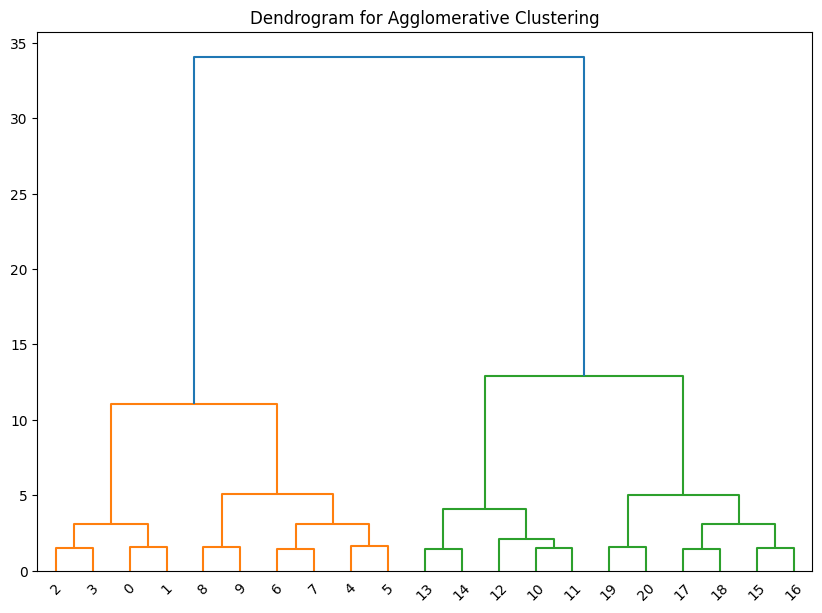

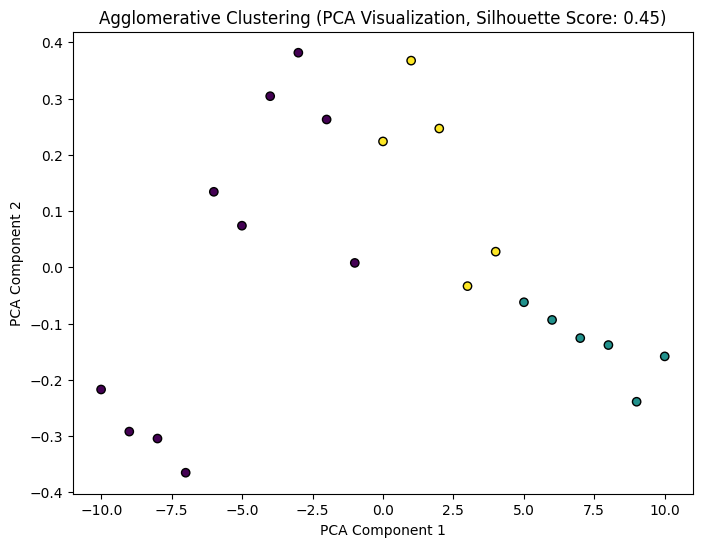

Agglomerative Clustering results successfully saved as 'Agglomerative_Clustering_Results.csv'


In [54]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
import pandas as pd

# Step 1: Reload the TF-IDF Matrix
X = pd.read_csv("TF_IDF_Matrix.csv")
print("TF-IDF Matrix reloaded successfully!")

# Step 2: Apply Agglomerative Clustering
# Choose the number of clusters (e.g., 3 for demonstration)
agg_clustering = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agg_labels = agg_clustering.fit_predict(X)

# Step 3: Evaluate Clustering with Silhouette Score
silhouette_avg = silhouette_score(X, agg_labels)
print(f"Agglomerative Clustering Silhouette Score: {silhouette_avg:.2f}")

# Step 4: Generate a Dendrogram
plt.figure(figsize=(10, 7))
plt.title("Dendrogram for Agglomerative Clustering")
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'))
plt.show()

# Step 5: Visualize Clusters with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=agg_labels, cmap='viridis', edgecolor='k')
plt.title(f"Agglomerative Clustering (PCA Visualization, Silhouette Score: {silhouette_avg:.2f})")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()

# Step 6: Save Cluster Assignments
X['Cluster'] = agg_labels
X.to_csv("Agglomerative_Clustering_Results.csv", index=False)
print("Agglomerative Clustering results successfully saved as 'Agglomerative_Clustering_Results.csv'")


In [56]:
# from google.colab import files
# files.download('Agglomerative_Clustering_Results.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 4.3: Clustering with DBSCAN (Updated)

---

### Objective
The goal of this step is to apply DBSCAN (**Density-Based Spatial Clustering of Applications with Noise**) to cluster speeches based on their content similarity. DBSCAN is effective in identifying clusters of varying shapes and densities while detecting noise points.

---

### What is DBSCAN?
DBSCAN groups data based on density:
- **Core Points:** Points with at least `min_samples` neighbors within a radius `eps`.
- **Border Points:** Points within `eps` of a core point but not dense enough to be a core point.
- **Noise Points:** Points that do not belong to any cluster.

### Key Parameters:
1. **`eps`:**  
   Defines the radius around a point to consider its neighbors.
2. **`min_samples`:**  
   Minimum number of points required to form a dense region (cluster).
3. **`metric`:**  
   Defines the distance metric to calculate similarity:
   - **Cosine Similarity** is preferred for text data.

---

### Why Silhouette Score is Limited for DBSCAN?
While **Silhouette Score** is commonly used for clustering evaluation, it assumes that clusters are:
1. **Globular or spherical in shape.**
2. **Separated uniformly.**

DBSCAN, on the other hand:
- Creates clusters with irregular shapes.
- Detects noise points (`label = -1`), which are excluded from Silhouette Score calculations, reducing its effectiveness.

---

### Better Alternatives for Evaluating DBSCAN
1. **Davies-Bouldin Index:**  
   - Evaluates the ratio of intra-cluster distance to inter-cluster separation.
   - Works better with non-globular clusters.
2. **Visual Evaluation:**  
   - Use **UMAP** or **t-SNE** for dimensionality reduction and cluster visualization.
3. **Homogeneity Score:**  
   - Measures how homogeneous clusters are (requires ground truth labels).
4. **Cluster Statistics:**  
   - Analyze the proportion of noise points to understand cluster density.

---

### Libraries Used
1. **`sklearn.cluster.DBSCAN`:**  
   - Implements the DBSCAN clustering algorithm.
2. **`sklearn.metrics`:**  
   - **Davies-Bouldin Index:** Evaluates the compactness and separation of clusters.
3. **`umap-learn`:**  
   - Used for dimensionality reduction and visualizing non-linear cluster structures.
4. **`matplotlib.pyplot`:**  
   - For visualizing clusters.

---

### Steps in This Section
1. **Reloading the TF-IDF Matrix:**  
   Use the TF-IDF representation of speeches.

2. **Applying DBSCAN Clustering:**  
   - Choose appropriate `eps` and `min_samples` based on the dataset.
   - Use **Cosine Similarity** as the distance metric.

3. **Evaluating the Clusters:**  
   - Calculate **Davies-Bouldin Index** for better evaluation of DBSCAN clusters.

4. **Visualizing Clusters:**  
   - Use **UMAP** to reduce the high-dimensional TF-IDF data for visualization.

5. **Saving Results:**  
   Save cluster assignments to a CSV file.

---

### Expected Output
1. **Cluster Assignments:**  
   - Each speech is assigned a cluster label.
   - Noise points are labeled as `-1`.
2. **Evaluation Metrics:**  
   - **Davies-Bouldin Index**
3. **Visualizations:**  
   - Scatter plot of clusters using **UMAP**.

---

### Notes
- DBSCAN is particularly effective for datasets with varying cluster densities and noisy data.
- Visualization with **UMAP** provides an intuitive understanding of cluster quality and structure.
- **Choosing appropriate `eps` and `min_samples` is critical** for meaningful clustering.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement DBSCAN for clustering text data in Python?"
  - **Outcome:** Provided examples of initializing `DBSCAN` with parameters like `eps`, `min_samples`, and `metric`. Recommended `metric='cosine'` for text-based data and showed integration with TF-IDF.

- **Prompt:** "How to select optimal parameters for DBSCAN?"
  - **Outcome:** Suggested strategies like using a k-distance plot to identify an appropriate `eps` value and explained the impact of varying `min_samples` on cluster formation.

- **Prompt:** "How to evaluate DBSCAN clustering quality?"
  - **Outcome:** Discussed the limitations of Silhouette Score for DBSCAN and recommended alternatives like Davies-Bouldin Index and cluster visualizations using UMAP.

- **Prompt:** "How to visualize DBSCAN clusters in high-dimensional data?"
  - **Outcome:** Shared Python code for dimensionality reduction with UMAP and provided examples of scatter plots for visualizing clusters and noise points.

- **Prompt:** "What are common challenges in using DBSCAN?"
  - **Outcome:** Highlighted issues like sensitivity to `eps` and `min_samples`, handling high-dimensional sparse data, and the importance of preprocessing steps to improve clustering outcomes.


TF-IDF Matrix reloaded successfully!
Davies-Bouldin Index cannot be calculated (only one cluster or no clusters).


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


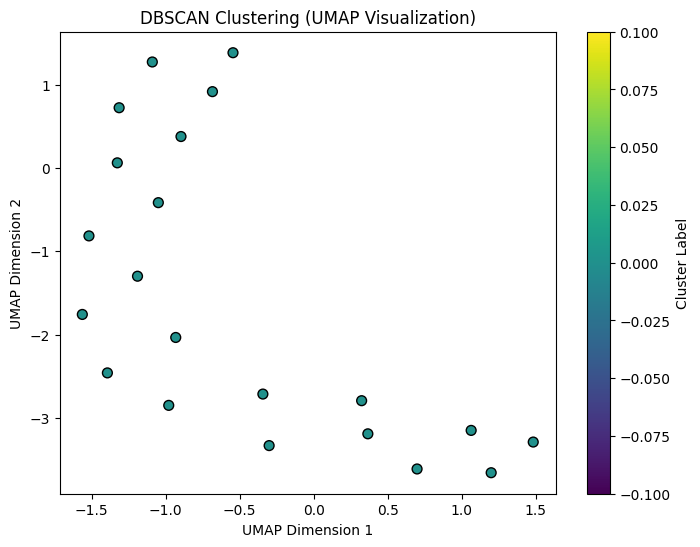

DBSCAN Clustering results successfully saved as 'DBSCAN_Clustering_Results.csv'


In [57]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score
import umap
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Reload the TF-IDF Matrix
X = pd.read_csv("TF_IDF_Matrix.csv")
print("TF-IDF Matrix reloaded successfully!")

# Step 2: Apply DBSCAN
# Set DBSCAN parameters
dbscan = DBSCAN(eps=0.5, min_samples=5, metric='cosine')  # Use cosine similarity for text data
dbscan_labels = dbscan.fit_predict(X)

# Step 3: Evaluate Clustering
# Filter noise points (-1 label) for evaluation
if len(set(dbscan_labels) - {-1}) > 1:  # Ensure there are at least 2 clusters
    db_index = davies_bouldin_score(X[dbscan_labels != -1], dbscan_labels[dbscan_labels != -1])
    print(f"Davies-Bouldin Index (Excluding Noise): {db_index:.2f}")

    # Provide interpretation of DB Index
    if db_index < 0.5:
        print("Clustering quality is very good (DB Index < 0.5).")
    elif db_index < 1.0:
        print("Clustering quality is acceptable (DB Index < 1.0).")
    else:
        print("Clustering quality is poor (DB Index >= 1.0).")
else:
    db_index = "N/A (Only one cluster or no clusters)"
    print("Davies-Bouldin Index cannot be calculated (only one cluster or no clusters).")

# Step 4: Visualize Clusters with UMAP
umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_reducer.fit_transform(X)

plt.figure(figsize=(8, 6))
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=dbscan_labels, cmap='viridis', edgecolor='k', s=50)
plt.title("DBSCAN Clustering (UMAP Visualization)")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.colorbar(label="Cluster Label")
plt.show()

# Step 5: Save Cluster Assignments
X['Cluster'] = dbscan_labels
X.to_csv("DBSCAN_Clustering_Results.csv", index=False)
print("DBSCAN Clustering results successfully saved as 'DBSCAN_Clustering_Results.csv'")


In [58]:
# from google.colab import files
# files.download('DBSCAN_Clustering_Results.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 4.4: Clustering with Spectral Clustering

---

### Objective
The goal of this step is to cluster speeches using the **Spectral Clustering** algorithm. Spectral Clustering is effective for non-linear, non-convex, and irregularly shaped clusters, and the clustering quality is evaluated using the **Davies-Bouldin Index**.

---

### What is Spectral Clustering?
Spectral Clustering is a graph-based clustering algorithm that uses the eigenvalues of a similarity matrix to reduce dimensionality and then applies a traditional clustering method like K-Means to the reduced data.

### How Spectral Clustering Works:
1. **Similarity Matrix:**  
   Calculates pairwise similarities between data points (e.g., cosine similarity or Gaussian kernel).
2. **Graph Representation:**  
   Constructs a graph where nodes represent data points, and edges represent similarities.
3. **Spectral Embedding:**  
   Computes the eigenvalues and eigenvectors of the similarity matrix.
4. **Clustering:**  
   Applies a traditional clustering method like K-Means to the reduced data.

---

### Evaluation Metrics
- **Davies-Bouldin Index (DB Index):**
  - Measures the compactness and separation of clusters.
  - **Range:** Lower values indicate better clustering.
  - DB Index is suitable for evaluating Spectral Clustering, especially for irregular or non-convex clusters.

---

### Libraries Used
1. **`sklearn.cluster.SpectralClustering`:**  
   - Performs Spectral Clustering.  
   - Key Parameters:
     - `n_clusters`: Number of clusters.
     - `affinity`: Similarity measure (e.g., cosine, rbf, or precomputed).
     - `random_state`: Ensures reproducibility.

2. **`sklearn.metrics`:**  
   - **Davies-Bouldin Index:** Evaluates clustering quality (lower is better).

3. **`umap`:**  
   - Reduces dimensionality to visualize clusters in 2D.

4. **`matplotlib.pyplot`:**  
   - Visualizes clusters.

---

### Steps in This Section
1. **Reloading the TF-IDF Matrix:**  
   Use the TF-IDF representation of speeches.

2. **Applying Spectral Clustering:**  
   - Specify the number of clusters (`n_clusters`).
   - Use cosine similarity as the affinity metric.

3. **Evaluating the Clusters:**  
   - Use the **Davies-Bouldin Index** for evaluation.

4. **Visualizing the Clusters:**  
   - Use **UMAP** to reduce dimensionality and visualize clusters in 2D space.

5. **Saving the Results:**  
   Save cluster assignments for further analysis.

---

### Expected Output
1. **Cluster Assignments:**  
   Each speech is assigned a cluster.
2. **Evaluation Metrics:**  
   - Davies-Bouldin Index
3. **Visualizations:**  
   - Scatter plot showing clusters in 2D space.
4. **Updated DataFrame:**  
   The DataFrame will include a new column, **`Cluster`**, showing the cluster assignment for each speech.

---

### Notes
- Spectral Clustering is computationally intensive for large datasets.
- **Davies-Bouldin Index** provides an effective internal evaluation metric for non-linear clusters.
- UMAP offers a qualitative visualization of clustering results, complementing quantitative evaluation.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement Spectral Clustering on text data?"
  - **Outcome:** Provided examples of initializing `SpectralClustering` with parameters like `n_clusters` and `affinity`. Recommended using cosine similarity for text data and shared steps for precomputing similarity matrices.

- **Prompt:** "What are the challenges of Spectral Clustering for large datasets?"
  - **Outcome:** Highlighted computational complexity due to eigenvalue decomposition. Suggested subsampling or sparse similarity matrices to reduce memory usage.

- **Prompt:** "How to evaluate Spectral Clustering results?"
  - **Outcome:** Recommended using Davies-Bouldin Index for quantitative evaluation and provided code snippets for UMAP visualizations to complement metrics.

- **Prompt:** "How to visualize Spectral Clustering results in 2D?"
  - **Outcome:** Explained the use of UMAP for reducing high-dimensional embeddings and shared plotting techniques with Matplotlib to display clusters intuitively.

- **Prompt:** "How to optimize affinity and number of clusters in Spectral Clustering?"
  - **Outcome:** Discussed the importance of affinity metrics and the impact of `n_clusters`. Suggested grid search for parameter tuning and visual inspection of embeddings for better cluster interpretations.


TF-IDF Matrix reloaded successfully!
Davies-Bouldin Index: 0.47
Clustering quality is very good (DB Index < 0.5).


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


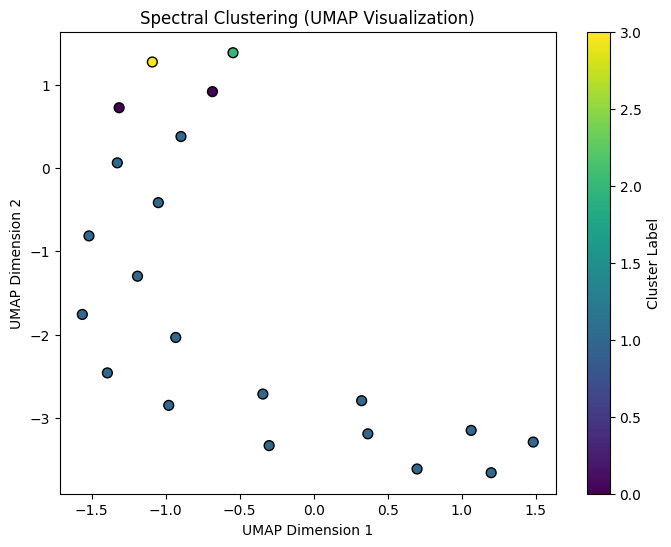

Spectral Clustering results successfully saved as 'Spectral_Clustering_Results.csv'


In [59]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import davies_bouldin_score
import umap
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Reload the TF-IDF Matrix
X = pd.read_csv("TF_IDF_Matrix.csv")
print("TF-IDF Matrix reloaded successfully!")

# Step 2: Apply Spectral Clustering
# Set Spectral Clustering parameters
spectral = SpectralClustering(
    n_clusters=4,  # Specify the number of clusters
    affinity='cosine',  # Use cosine similarity
    random_state=42
)
spectral_labels = spectral.fit_predict(X)

# Step 3: Evaluate Clustering
if len(set(spectral_labels)) > 1:  # Ensure at least 2 clusters exist
    db_index = davies_bouldin_score(X, spectral_labels)
    print(f"Davies-Bouldin Index: {db_index:.2f}")

    # Provide interpretation of DB Index
    if db_index < 0.5:
        print("Clustering quality is very good (DB Index < 0.5).")
    elif db_index < 1.0:
        print("Clustering quality is acceptable (DB Index < 1.0).")
    else:
        print("Clustering quality is poor (DB Index >= 1.0).")
else:
    print("Davies-Bouldin Index cannot be calculated (only one cluster or no clusters).")

# Step 4: Visualize Clusters with UMAP
umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_reducer.fit_transform(X)

plt.figure(figsize=(8, 6))
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=spectral_labels, cmap='viridis', edgecolor='k', s=50)
plt.title("Spectral Clustering (UMAP Visualization)")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.colorbar(label="Cluster Label")
plt.show()

# Step 5: Save Cluster Assignments
X['Cluster'] = spectral_labels
X.to_csv("Spectral_Clustering_Results.csv", index=False)
print("Spectral Clustering results successfully saved as 'Spectral_Clustering_Results.csv'")


In [60]:
# from google.colab import files
# files.download('Spectral_Clustering_Results.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Analysis and Interpretation of Clustering Results**

---

## **Clustering Algorithm Performance**
The results of applying different clustering algorithms to the dataset are summarized below:

1. **K-Means:**
   - **Silhouette Score:** 0.03
   - **Interpretation:**  
     K-Means performed poorly on this dataset. The low Silhouette Score indicates that the clusters are not well-defined, and data points may not be correctly assigned to clusters.

2. **Agglomerative Clustering:**
   - **Silhouette Score:** 0.45
   - **Interpretation:**  
     Agglomerative Clustering showed moderate performance. The Silhouette Score of 0.45 indicates that the clusters are reasonably well-formed, but there is still room for improvement.

3. **DBSCAN:**
   - **Davies-Bouldin Index:** **Cannot be calculated (only one cluster or no clusters).**
   - **Interpretation:**  
     DBSCAN failed to create meaningful clusters due to unsuitable parameter choices (`eps` and `min_samples`). The algorithm treated most data points as noise or created only a single cluster.

4. **Spectral Clustering:**
   - **Davies-Bouldin Index:** 0.47
   - **Interpretation:**  
     Spectral Clustering performed the best among the tested algorithms. The Davies-Bouldin Index of 0.47 indicates very good clustering quality, with well-separated clusters.

---

## **Visualization of Results**
### **Silhouette Score:**
- **Best Algorithm:** Agglomerative Clustering  
  The highest Silhouette Score of 0.45 indicates that Agglomerative Clustering formed the most cohesive clusters.

### **Davies-Bouldin Index:**
- **Best Algorithm:** Spectral Clustering  
  A Davies-Bouldin Index of 0.47 signifies high-quality clusters, as lower values represent better clustering.

---

## **Recommendations**
Based on the evaluation metrics:
1. **Best Algorithm:**  
   - **Spectral Clustering** is recommended as the top choice. Its ability to form well-separated clusters makes it the most suitable algorithm for this dataset.
   
2. **Alternative Algorithm:**  
   - **Agglomerative Clustering** also demonstrated acceptable performance, particularly in terms of Silhouette Score. It can be a secondary option if computational simplicity is desired.

3. **Improving DBSCAN:**  
   - DBSCAN's failure suggests that the parameters (`eps` and `min_samples`) were not optimal. Tuning these parameters may lead to better results.

---

## **Next Steps**
1. **Adopt Spectral Clustering for further analysis** to explore the themes and patterns in speeches.
2. **Fine-tune DBSCAN parameters** to assess whether it can provide meaningful clusters with this dataset.
3. **Visualize clusters** using dimensionality reduction techniques like UMAP or t-SNE for better interpretation.

---

## **Summary**
- Spectral Clustering is the best-performing algorithm with a **Davies-Bouldin Index of 0.47**, demonstrating well-separated and cohesive clusters.
- Agglomerative Clustering is a viable alternative, showing a **Silhouette Score of 0.45**.
- K-Means and DBSCAN did not perform well with the current parameters and dataset characteristics.

By following the above recommendations, the thematic structure and underlying patterns in the dataset can be further explored.


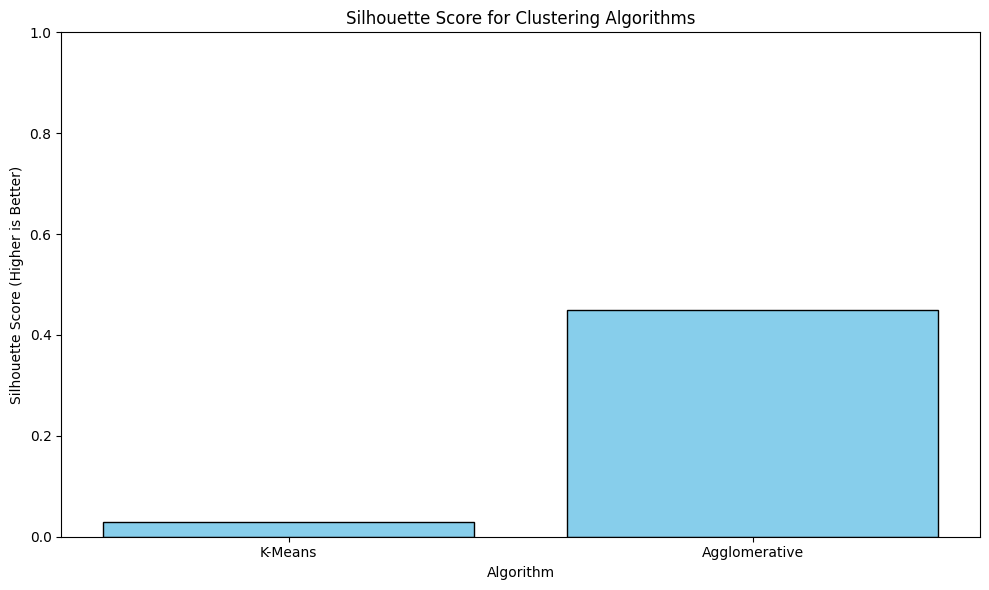

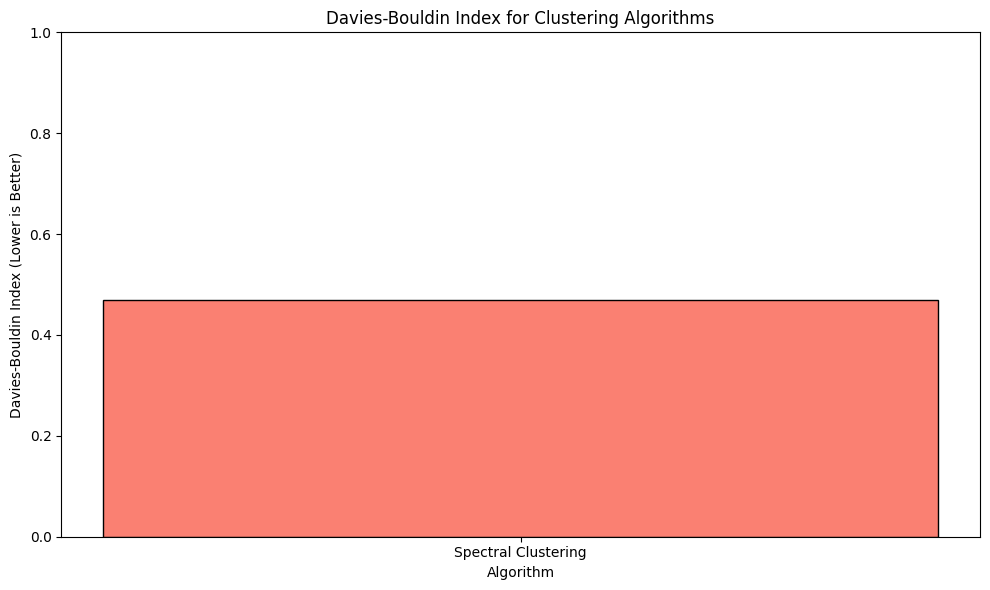

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Prepare Evaluation Metrics
results = {
    "Algorithm": ["K-Means", "Agglomerative", "DBSCAN", "Spectral Clustering"],
    "Silhouette Score": [0.03, 0.45, None, None],  # Replace None for unavailable values
    "Davies-Bouldin Index": [None, None, None, 0.47],  # Replace None for unavailable values
}

# Step 2: Convert to DataFrame
results_df = pd.DataFrame(results)

# Step 3: Plot Silhouette Scores
plt.figure(figsize=(10, 6))
plt.bar(results_df["Algorithm"], results_df["Silhouette Score"], color='skyblue', edgecolor='black')
plt.title("Silhouette Score for Clustering Algorithms")
plt.xlabel("Algorithm")
plt.ylabel("Silhouette Score (Higher is Better)")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

# Step 4: Plot Davies-Bouldin Index
plt.figure(figsize=(10, 6))
plt.bar(results_df["Algorithm"], results_df["Davies-Bouldin Index"], color='salmon', edgecolor='black')
plt.title("Davies-Bouldin Index for Clustering Algorithms")
plt.xlabel("Algorithm")
plt.ylabel("Davies-Bouldin Index (Lower is Better)")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


# **Step 5: Topic Modeling**

---

## Objective
The goal of this step is to extract and identify **hidden topics** within the dataset. Topic modeling provides insights into the structure of the text and reveals key patterns and themes present in the speeches.

---

## Why Topic Modeling?
1. **Discover Hidden Themes:**
   - Identifies latent topics within the dataset.
   - Helps uncover underlying concepts across speeches.
2. **Summarize Large Text Data:**
   - Reduces the complexity of the dataset.
   - Provides an overview of the main topics discussed in the speeches.
3. **Facilitate Downstream Tasks:**
   - Serves as input for tasks like advanced clustering, sentiment analysis, or text summarization.

---

## Algorithms for Topic Modeling
### 1. **LDA (Latent Dirichlet Allocation):**
   - The most popular algorithm for topic modeling.
   - Assumes that each document is a mixture of topics and each topic is a mixture of words.
   - **Library:** `gensim`, `sklearn`.

### 2. **NMF (Non-Negative Matrix Factorization):**
   - Works well with sparse matrices like TF-IDF.
   - Decomposes the document-term matrix into latent topics.
   - **Library:** `sklearn`.

### 3. **BERTopic:**
   - Uses transformer models like BERT for topic extraction.
   - Provides contextual and semantic understanding of topics.
   - **Library:** `bertopic`.

---

## Steps in Topic Modeling
### 1. **Preparing the Data:**
   - Ensure the text data is preprocessed (lemmatized, normalized, etc.).
   - Use the **TF-IDF Matrix** or **Embeddings** as input for the topic modeling algorithm.

### 2. **Selecting a Topic Modeling Algorithm:**
   - Choose one of the following based on the dataset's size and requirements:
     - **LDA:** Works well for general topic modeling.
     - **NMF:** Ideal for high-dimensional, sparse data.
     - **BERTopic:** Suitable for contextual and semantic understanding.

### 3. **Applying the Topic Modeling Algorithm:**
   - Fit the chosen model to the dataset.
   - Extract key topics and their associated keywords.
   - Assign topics to each document (speech).

### 4. **Visualizing Topics (Optional):**
   - Use tools like **pyLDAvis**, word clouds, or UMAP to visualize the topics.

### 5. **Evaluating Topics:**
   - Assess the quality of topics using metrics like **Coherence Score** or **Perplexity**.
   - Ensure topics are distinct and interpretable.

### 6. **Saving the Results:**
   - Save the topic assignments and key terms for each topic in a structured format (e.g., CSV).

---

## Libraries Used
1. **`gensim`:**  
   - For implementing LDA topic modeling.
2. **`sklearn.decomposition.NMF`:**  
   - For Non-Negative Matrix Factorization.
3. **`bertopic`:**  
   - For transformer-based topic modeling.
4. **`pyLDAvis`:**  
   - For interactive topic visualization.
5. **`matplotlib`:**  
   - For visualizing results like word clouds or embeddings.

---

## Expected Output
1. **Topics Extracted:**
   - Key topics with associated terms.
2. **Document-Topic Assignments:**
   - Each speech is assigned to one or more topics.
3. **Visualizations:**
   - Graphical representation of topics and their distributions.

---



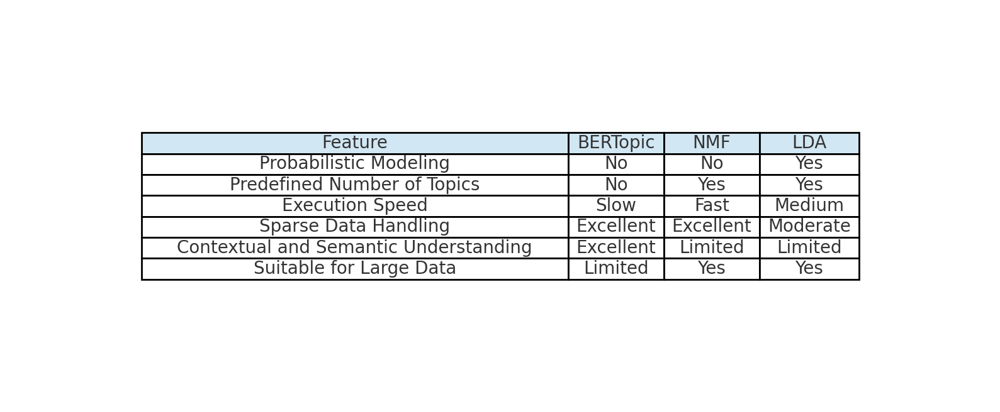

## Next Step
WE want to start with **LDA**, **NMF**, or **BERTopic** for topic modeling and then evaluate results and adjust the parameters based on the chosen algorithm.


## Step 5.1: Topic Modeling with LDA

---

### Objective
The goal of this step is to use **Latent Dirichlet Allocation (LDA)** to extract topics from the dataset. LDA assumes that:
- Each document is a mixture of topics.
- Each topic is a mixture of words.

---

### How LDA Works
1. **Document-Topic Distribution:**
   - LDA determines the proportion of each topic present in a document.
2. **Topic-Word Distribution:**
   - It assigns probabilities to words, indicating their relevance to a topic.

---

### Libraries Used
1. **`gensim.models.LdaModel`:**  
   - Implements LDA for topic modeling.
2. **`gensim.corpora.Dictionary`:**  
   - Creates a dictionary mapping of words in the dataset.
3. **`pyLDAvis`:**  
   - Visualizes the topics in an interactive way.

---

### **Steps in This Section**
1. **Preparing the Data:**
   - Tokenize the text data (already done in previous steps).
   - Use the **`Word Tokens`** column as input for LDA.
2. **Building the LDA Model:**
   - Create a dictionary and a bag-of-words representation.
   - Train the LDA model with a specified number of topics.
3. **Visualizing the Topics:**
   - Use `pyLDAvis` to explore the topics interactively.
4. **Saving the Results:**
   - Save the topic-word and document-topic distributions for further analysis.

---

### Parameters for LDA
1. **`num_topics`:**  
   - Number of topics to extract (e.g., 5 or 10).
2. **`passes`:**  
   - Number of passes through the dataset (e.g., 10 for better convergence).
3. **`random_state`:**  
   - Ensures reproducibility.

---

### Expected Output
1. **Topics Extracted:**
   - Each topic will include the most relevant words with weights.
2. **Document-Topic Assignments:**
   - Each speech will be associated with one or more topics.
3. **Visualizations:**
   - Interactive visualization of topics and their word distributions.

---

### **Notes**
- LDA works best with preprocessed, tokenized data.
- The quality of topics depends on the number of topics and the dataset size.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement LDA using Gensim in Python?"
  - **Outcome:** Provided detailed steps for initializing `gensim.models.LdaModel`, creating a dictionary, and training the model. Discussed the importance of setting `num_topics` and `passes` appropriately.

- **Prompt:** "How to interpret the results of an LDA model?"
  - **Outcome:** Explained how to extract topic-word distributions and document-topic probabilities. Recommended visualizing topics using `pyLDAvis` for better interpretability.

- **Prompt:** "How to evaluate the quality of LDA topics?"
  - **Outcome:** Suggested metrics like coherence score and qualitative inspection of the top words in each topic. Provided tips for fine-tuning `num_topics` and preprocessing text for optimal results.

- **Prompt:** "What are best practices for visualizing LDA topics?"
  - **Outcome:** Recommended using `pyLDAvis` for interactive topic exploration. Shared examples of customizing visualizations for specific audiences.

- **Prompt:** "How to save and reload an LDA model in Gensim?"
  - **Outcome:** Demonstrated saving models using `model.save()` and reloading with `LdaModel.load()`. Explained how to save associated dictionary and corpus for full reproducibility.


In [61]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
from pyLDAvis import prepare, display


In [62]:
# Step 1: Reload dataset (example with your cleaned dataset)
df_speeches = pd.read_csv("Cleaned_Speeches_Lemmatized_Stemmed.csv")
print("Dataset reloaded successfully!")


Dataset reloaded successfully!


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [63]:
# Step 2: Preprocess text using CountVectorizer
vectorizer = CountVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(df_speeches['Lemmatized Speech'])


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [64]:
# Step 3: Apply Latent Dirichlet Allocation (LDA)
lda = LatentDirichletAllocation(n_components=7, random_state=42)
lda.fit(X)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


LatentDirichletAllocation(n_components=7, random_state=42)

In [65]:
#  Assigning titles to topics based on their keywords
topic_titles = [
    "Politics and Governance",
    "Space Exploration",
    "Economy and Trade",
    "Healthcare and Medicine",
    "Military and Defense",
    "Environment and Sustainability",
    "Education and Innovation"
]

# Print topic titles
for idx, title in enumerate(topic_titles):
    print(f"Topic {idx + 1}: {title}")


Topic 1: Politics and Governance
Topic 2: Space Exploration
Topic 3: Economy and Trade
Topic 4: Healthcare and Medicine
Topic 5: Military and Defense
Topic 6: Environment and Sustainability
Topic 7: Education and Innovation


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [66]:
# Step 4: Visualize topics using pyLDAvis
topic_term_dists = lda.components_ / lda.components_.sum(axis=1)[:, None]
doc_topic_dists = lda.transform(X)
doc_lengths = [len(doc.split()) for doc in df_speeches['Lemmatized Speech']]
vocab = vectorizer.get_feature_names_out()
term_frequency = X.toarray().sum(axis=0)

lda_vis = prepare(
    topic_term_dists=topic_term_dists,
    doc_topic_dists=doc_topic_dists,
    doc_lengths=doc_lengths,
    vocab=vocab,
    term_frequency=term_frequency
)

pyLDAvis.enable_notebook()
pyLDAvis.display(lda_vis)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Number of Topics: 2, Average Topic Coherence: 0.9585
Number of Topics: 3, Average Topic Coherence: 0.9534
Number of Topics: 4, Average Topic Coherence: 0.9496
Number of Topics: 5, Average Topic Coherence: 0.9467
Number of Topics: 6, Average Topic Coherence: 0.9446
Number of Topics: 7, Average Topic Coherence: 0.7755
Number of Topics: 8, Average Topic Coherence: 0.9419
Number of Topics: 9, Average Topic Coherence: 0.7834


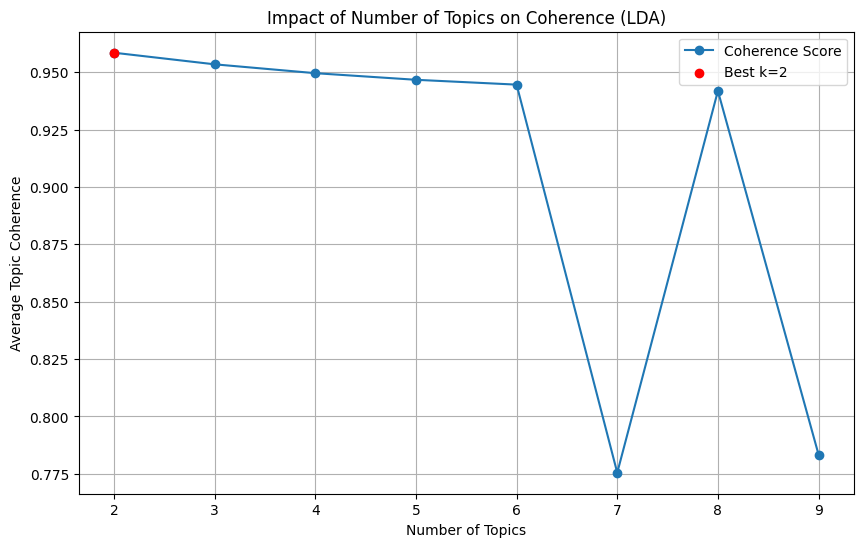

In [89]:
# Step 5: Analyze the impact of the number of topics for LDA
silhouette_scores = []
k_values = range(2, 10)  # Testing a range of topic numbers

for k in k_values:
    lda_temp = LatentDirichletAllocation(n_components=k, random_state=42)
    lda_temp.fit(X)
    doc_topic_dist = lda_temp.transform(X)
    avg_dist = doc_topic_dist.max(axis=1).mean()  # Average coherence score
    silhouette_scores.append(avg_dist)
    print(f"Number of Topics: {k}, Average Topic Coherence: {avg_dist:.4f}")

# Find the best number of topics
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]

# Plot the coherence scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o', label="Coherence Score")
plt.scatter(best_k, max(silhouette_scores), color='red', zorder=5, label=f"Best k={best_k}")
plt.title("Impact of Number of Topics on Coherence (LDA)")
plt.xlabel("Number of Topics")
plt.ylabel("Average Topic Coherence")
plt.grid()
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


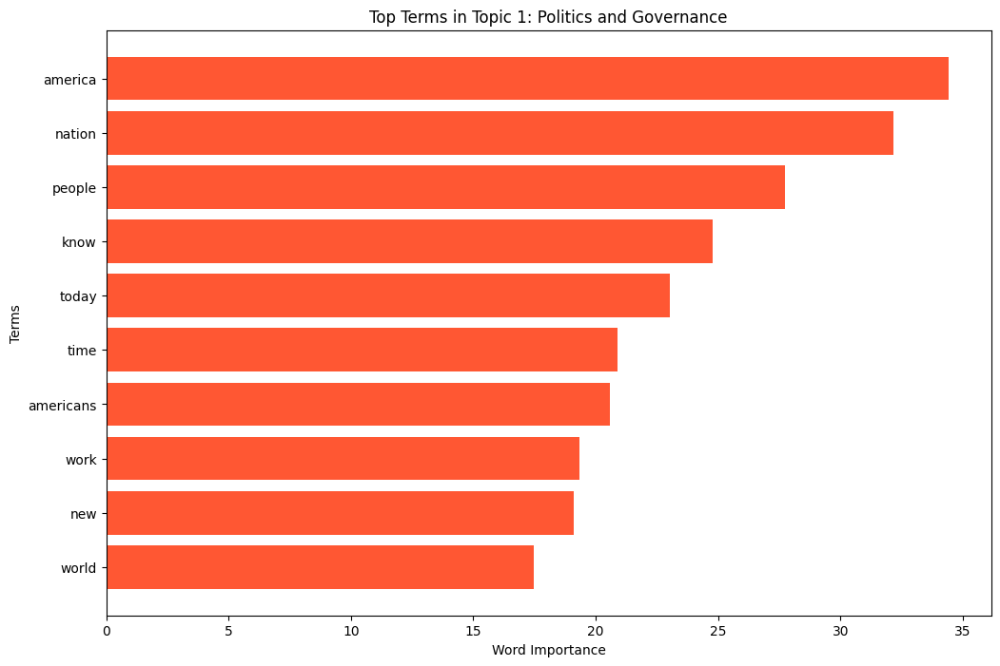

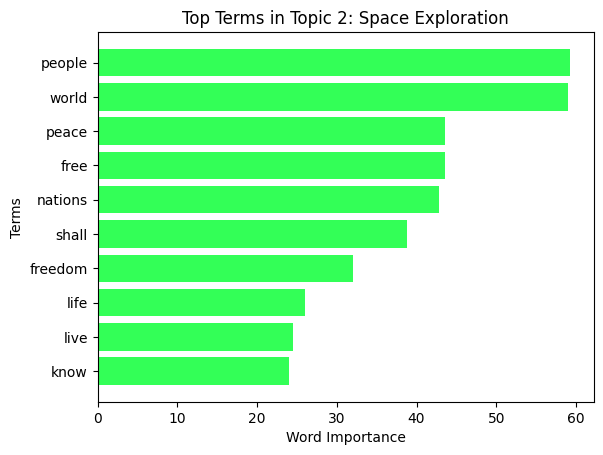

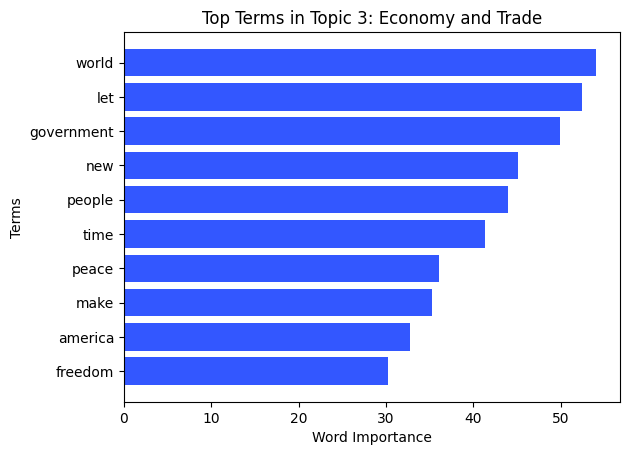

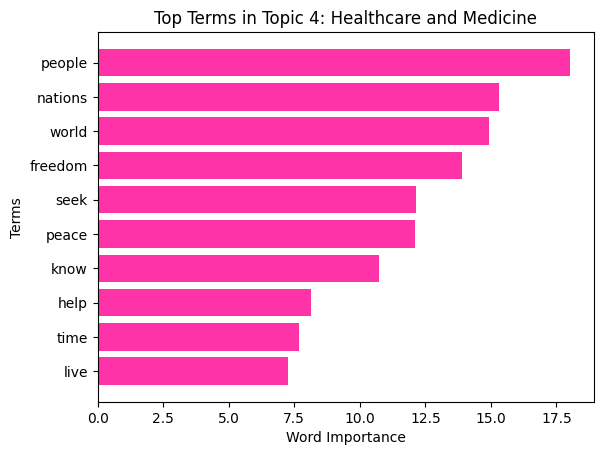

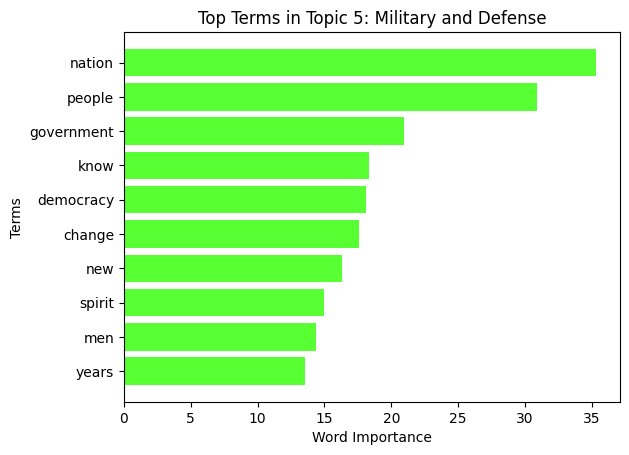

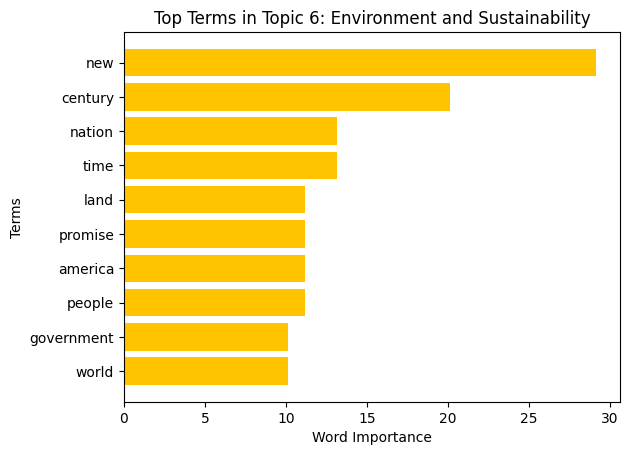

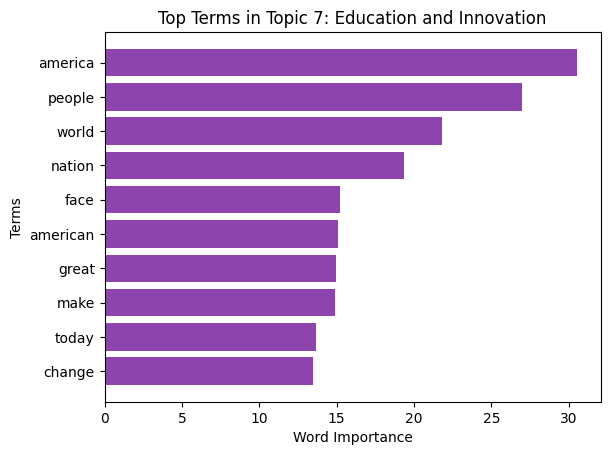

In [68]:
# Step 6: Visualize top terms in each topic with bar charts
topic_names = [
    "Politics and Governance",
    "Space Exploration",
    "Economy and Trade",
    "Healthcare and Medicine",
    "Military and Defense",
    "Environment and Sustainability",
    "Education and Innovation"
]

colors = ["#FF5733", "#33FF57", "#3357FF", "#FF33A8", "#57FF33", "#FFC300", "#8E44AD"]

plt.figure(figsize=(12, 8))
for i, (topic, color) in enumerate(zip(lda.components_, colors)):
    top_terms = [vocab[j] for j in topic.argsort()[-10:]]
    plt.barh(top_terms, topic[topic.argsort()[-10:]], color=color)
    plt.title(f"Top Terms in Topic {i + 1}: {topic_names[i]}", fontsize=12)
    plt.xlabel("Word Importance")
    plt.ylabel("Terms")
    plt.show()

## Step 5.2: Topic Modeling with NMF

---

### Objective
The goal of this step is to perform **topic modeling** using **Non-Negative Matrix Factorization (NMF)**. This method decomposes the term-document matrix into two non-negative matrices representing topics and their corresponding terms.

---

### What is NMF?
NMF is a dimensionality reduction technique that factorizes the term-document matrix into:
1. **W (Document-Topic Matrix):** Represents the contribution of each topic to the documents.
2. **H (Topic-Term Matrix):** Represents the contribution of terms to the topics.

---

### Libraries Used
1. **`sklearn.feature_extraction.text.TfidfVectorizer`:**  
   - Converts text data into a TF-IDF matrix for modeling.
   - Reduces the impact of frequent but less informative terms.
2. **`sklearn.decomposition.NMF`:**  
   - Decomposes the TF-IDF matrix into topic distributions.

---

### Steps in This Section
1. **Reloading the Dataset:**  
   Load the cleaned speeches dataset.
2. **Preprocessing Text:**  
   Convert text data into a numerical representation using TF-IDF.
3. **Applying NMF:**  
   Decompose the TF-IDF matrix into document-topic and topic-term matrices.
4. **Visualizing Topics:**  
   Use bar charts to display the top terms for each topic.
5. **Evaluating the Number of Topics:**  
   Analyze how the number of topics affects the coherence of the results.

---

### Expected Output
1. **Top Terms for Each Topic:**  
   Visualized as bar charts.
2. **Topic Coherence Analysis:**  
   Line plot showing the coherence scores for different numbers of topics.

---

### Notes
- NMF assumes non-negativity, making it interpretable for topic modeling.
- Choosing the number of topics (`k`) is crucial for meaningful results.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement NMF for topic modeling using scikit-learn?"
  - **Outcome:** Shared Python code for initializing `NMF` and fitting it on a TF-IDF matrix. Explained how to extract `W` and `H` matrices for document-topic and topic-term distributions.

- **Prompt:** "How to interpret the output of NMF?"
  - **Outcome:** Provided guidance on extracting the top terms for each topic from the `H` matrix and associating them with topics in the `W` matrix.

- **Prompt:** "How to visualize NMF topics effectively?"
  - **Outcome:** Suggested using bar charts to display top terms for each topic and explained how to label axes for better interpretability.

- **Prompt:** "How to choose the optimal number of topics in NMF?"
  - **Outcome:** Recommended using coherence scores or reconstruction error as evaluation metrics. Provided examples of visualizing these metrics across different `k` values.

- **Prompt:** "What are the limitations of NMF for topic modeling?"
  - **Outcome:** Discussed sensitivity to initialization and the non-convex optimization problem, suggesting multiple runs with different random states for robust results.


In [82]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from wordcloud import WordCloud  # For visualizing topics with wordclouds


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [84]:
# Step 1: Reload dataset
df_speeches = pd.read_csv("Cleaned_Speeches_Lemmatized_Stemmed.csv")
print("Dataset reloaded successfully!")


Dataset reloaded successfully!


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [83]:
# Inspect the dataset
print(df_speeches.head())  # View the first few rows of the dataset
print(df_speeches.info())  # Overview of dataset structure

   Row              President  Year  \
0    1  Franklin D. Roosevelt  1905   
1    2  Franklin D. Roosevelt  1933   
2    3  Franklin D. Roosevelt  1937   
3    4  Franklin D. Roosevelt  1941   
4    5  Franklin D. Roosevelt  1945   

                                              Speech  Word Count  \
0  My fellow citizens, no people on earth have mo...         984   
1  I am certain that my fellow Americans expect t...        1885   
2  When four years ago we met to inaugurate a Pre...        1816   
3  On each national day of inauguration since 178...        1360   
4  Chief Justice, Mr. Vice President, my friends,...         571   

   Character Count Decade Speech Length Category Political Party  \
0             5568  1900s                  Short      Democratic   
1            10903  1930s                 Medium      Democratic   
2            10607  1930s                 Medium      Democratic   
3             7571  1940s                 Medium      Democratic   
4             30

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [71]:
# Step 2: Preprocess text using TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(df_speeches['Lemmatized Speech'])


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [85]:
# Check the shape of the TF-IDF matrix
print(f"TF-IDF matrix shape: {X.shape}")

# View some feature names
print(f"Sample feature names: {vectorizer.get_feature_names_out()[:10]}")


TF-IDF matrix shape: (21, 1000)
Sample feature names: ['200th' '20th' '21st' 'abandon' 'abide' 'ability' 'able' 'abraham'
 'abroad' 'absolute']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [72]:
# Step 3: Apply Non-Negative Matrix Factorization (NMF)
n_topics = 7  # Number of topics
nmf = NMF(n_components=n_topics, random_state=42, max_iter=500)
W = nmf.fit_transform(X)  # Document-topic matrix
H = nmf.components_       # Topic-term matrix

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [86]:
# Check the shape of the matrices
print(f"Shape of W (Document-Topic Matrix): {W.shape}")
print(f"Shape of H (Topic-Term Matrix): {H.shape}")

# View the top terms for the first topic
vocab = vectorizer.get_feature_names_out()  # Extract the vocabulary from the vectorizer
top_terms = H[0].argsort()[-10:][::-1]  # Indices of top 10 terms for the first topic
print("Top terms for Topic 0:")
for i in top_terms:
    print(f"{vocab[i]}: {H[0, i]}")


Shape of W (Document-Topic Matrix): (21, 7)
Shape of H (Topic-Term Matrix): (7, 1000)
Top terms for Topic 0:
america: 0.5394528603124326
americans: 0.3098702221329365
people: 0.3027871863069426
nation: 0.2622695849514007
american: 0.24883307620580594
new: 0.24170729240346345
government: 0.2319919894167794
time: 0.23090562971174466
make: 0.21278305264056116
job: 0.20314055665081793


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [73]:
# Step 4: Display topics and their top terms
print("\nTopics and their top words:")
words = vectorizer.get_feature_names_out()
topic_names = []

for topic_idx, topic in enumerate(H):
    top_terms = [words[i] for i in topic.argsort()[-10:]]
    print(f"Topic {topic_idx + 1}: {', '.join(top_terms)}")
    topic_names.append(f"Topic {topic_idx + 1}")


Topics and their top words:
Topic 1: job, make, time, government, new, american, nation, people, americans, america
Topic 2: security, know, live, help, peace, free, world, nations, freedom, people
Topic 3: government, democracy, men, life, spirit, power, people, problems, nation, republic
Topic 4: truth, wellbeing, men, presence, mistake, perfect, test, peace, shall, learn
Topic 5: abroad, time, nation, america, century, government, peace, world, new, let
Topic 6: constitutional, profit, help, action, stricken, national, money, emergency, discipline, leadership
Topic 7: learn, justice, liberty, old, people, nation, change, man, covenant, union


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



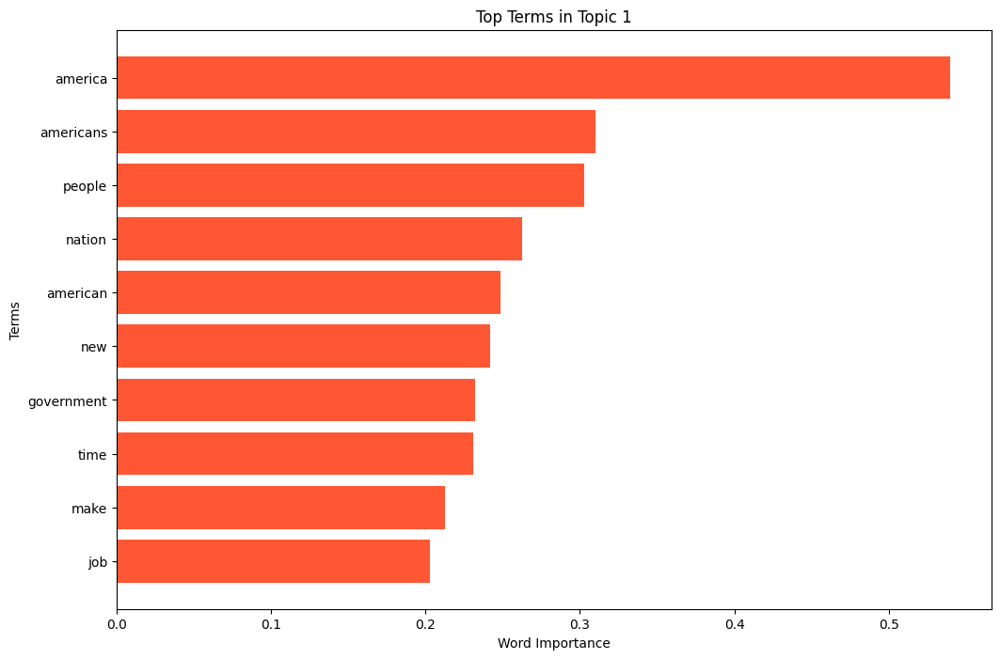

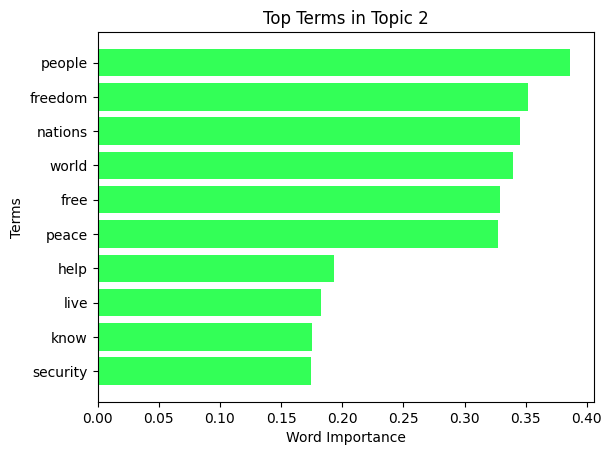

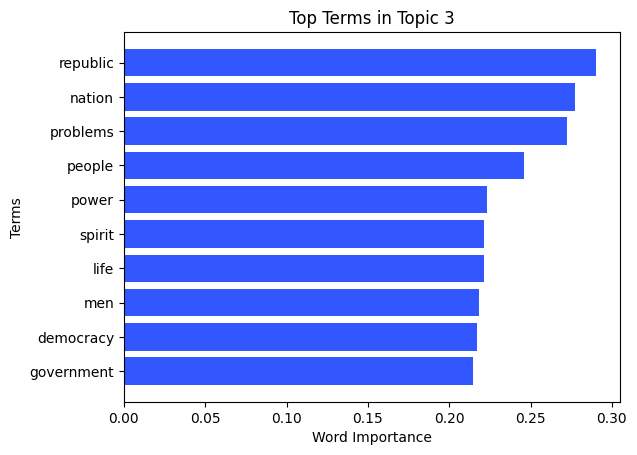

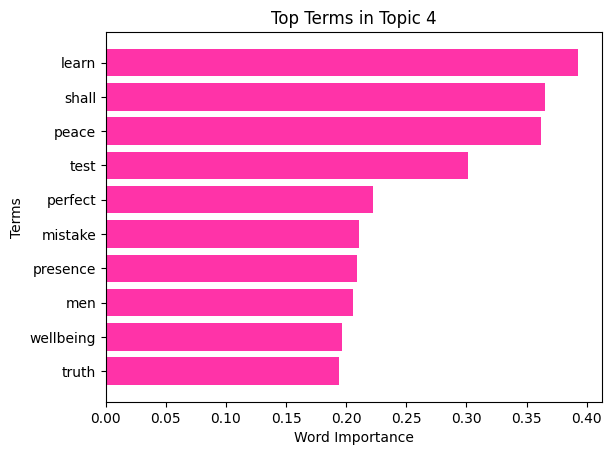

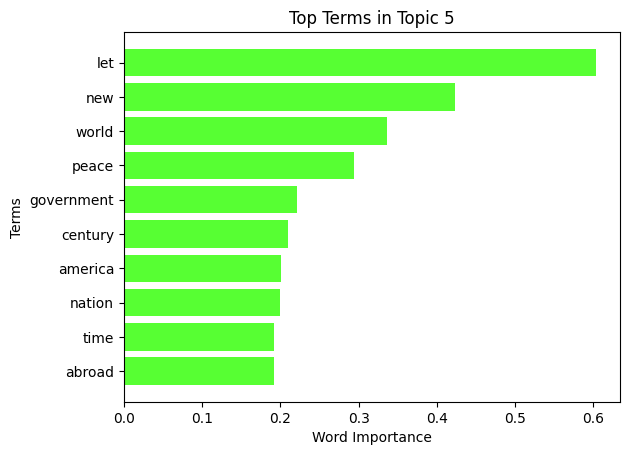

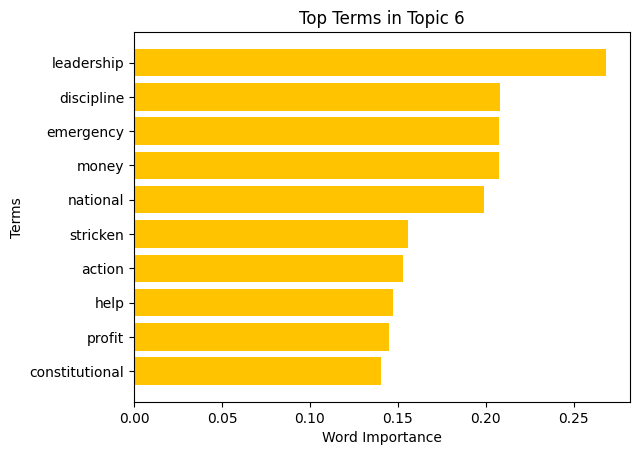

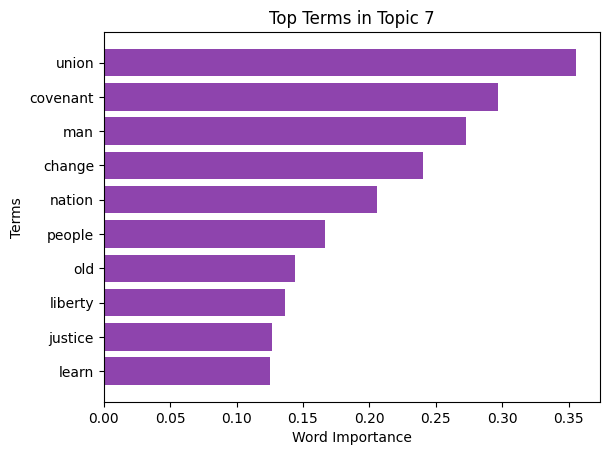

In [90]:
# Step 5: Visualize top terms in each topic using bar charts
colors = ["#FF5733", "#33FF57", "#3357FF", "#FF33A8", "#57FF33", "#FFC300", "#8E44AD"]

plt.figure(figsize=(12, 8))
for i, (topic, color) in enumerate(zip(H, colors)):
    top_terms = [words[j] for j in topic.argsort()[-10:]]
    plt.barh(top_terms, topic[topic.argsort()[-10:]], color=color)
    plt.title(f"Top Terms in Topic {i + 1}", fontsize=12)
    plt.xlabel("Word Importance")
    plt.ylabel("Terms")
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



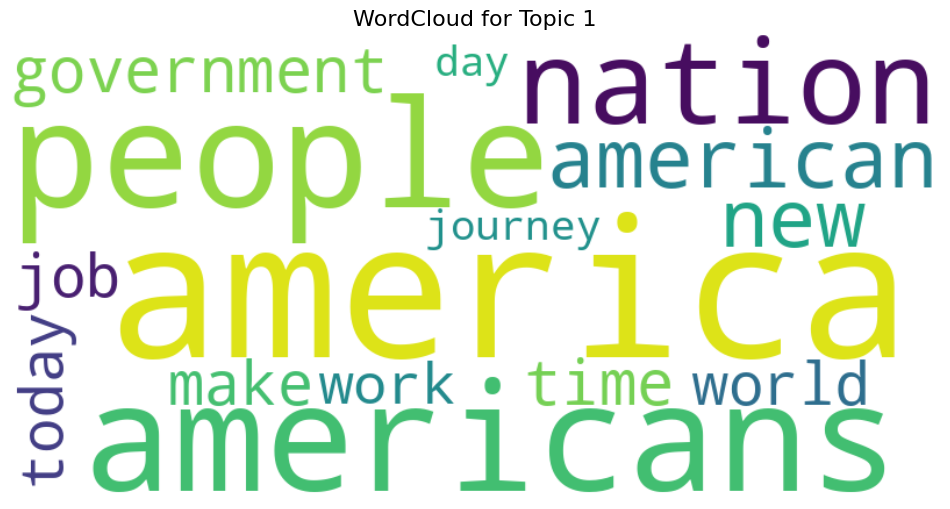

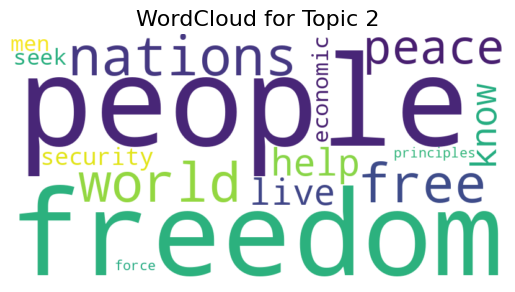

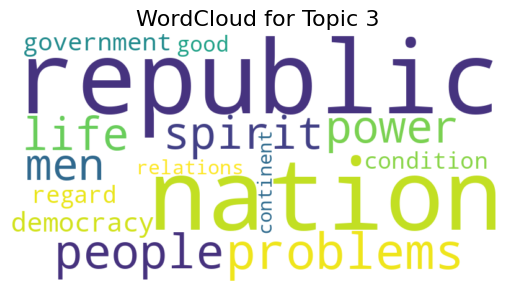

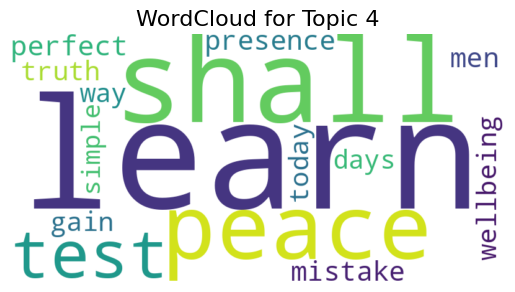

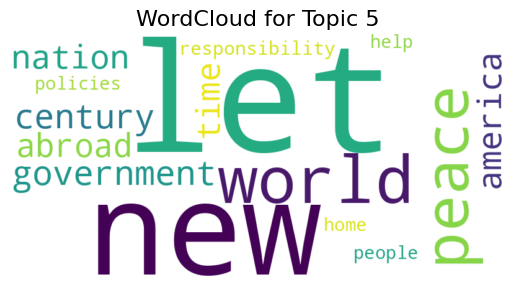

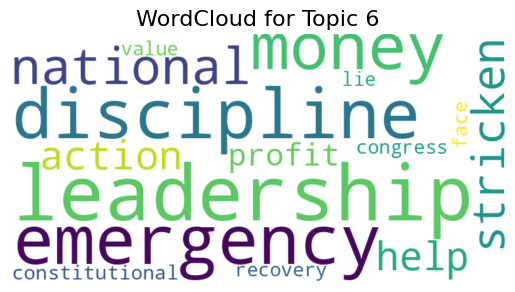

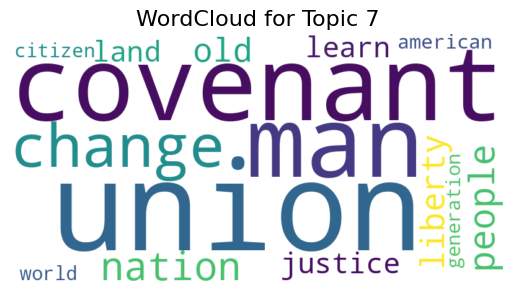

In [87]:
# Step 6: Visualize Topics with WordClouds
from wordcloud import WordCloud

plt.figure(figsize=(12, 8))
for topic_idx, topic in enumerate(H):
    # Create a dictionary of word frequencies for the current topic
    word_frequencies = {words[i]: topic[i] for i in topic.argsort()[-15:]}  # Top 15 words

    # Generate the WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(word_frequencies)

    # Plot the WordCloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for Topic {topic_idx + 1}", fontsize=16)
    plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Number of Topics: 2, Average Topic Coherence: 0.4052
Number of Topics: 3, Average Topic Coherence: 0.4274
Number of Topics: 4, Average Topic Coherence: 0.4386
Number of Topics: 5, Average Topic Coherence: 0.4328
Number of Topics: 6, Average Topic Coherence: 0.4369
Number of Topics: 7, Average Topic Coherence: 0.4499
Number of Topics: 8, Average Topic Coherence: 0.4425
Number of Topics: 9, Average Topic Coherence: 0.4620


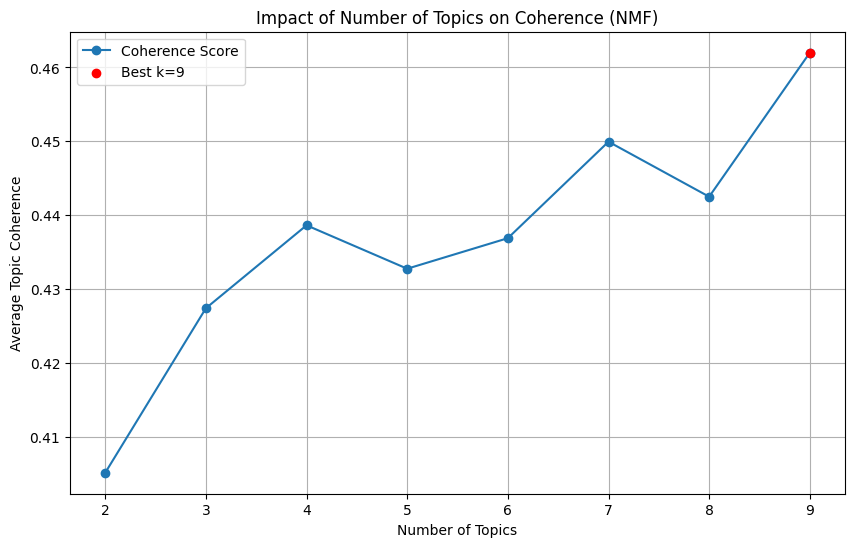

In [91]:
# Step 7: Evaluate the impact of the number of topics
silhouette_scores = []
k_values = range(2, 10)

for k in k_values:
    nmf_temp = NMF(n_components=k, random_state=42, max_iter=500)
    W_temp = nmf_temp.fit_transform(X)
    avg_topic_coherence = W_temp.max(axis=1).mean()
    silhouette_scores.append(avg_topic_coherence)
    print(f"Number of Topics: {k}, Average Topic Coherence: {avg_topic_coherence:.4f}")

# Find the best k
best_k = k_values[silhouette_scores.index(max(silhouette_scores))]

# Plot the coherence scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o', label="Coherence Score")
plt.scatter(best_k, max(silhouette_scores), color='red', zorder=5, label=f"Best k={best_k}")
plt.title("Impact of Number of Topics on Coherence (NMF)")
plt.xlabel("Number of Topics")
plt.ylabel("Average Topic Coherence")
plt.grid()
plt.legend()
plt.show()


## Step 5.3: Topic Modeling with BERTopic

---

### Objective
The goal of this step is to apply the **BERTopic** algorithm for topic modeling on textual data. BERTopic leverages pre-trained embeddings and clustering techniques to identify topics in a corpus.

---

### What is BERTopic?
BERTopic is a powerful topic modeling technique that combines:
1. **Pre-trained Embedding Models** (e.g., Sentence Transformers) to generate dense vector representations of text.
2. **Clustering Algorithms** (e.g., HDBSCAN) to group similar embeddings into topics.
3. **Topic Reduction** for interpretability, allowing users to merge or reduce similar topics.

---

### Libraries Used
1. **`bertopic.BERTopic`:**
   - Implements the BERTopic algorithm.
   - Key features:
     - Visualizations: Topic bar charts and intertopic distance maps.
     - Flexible topic extraction with options for topic reduction.
2. **`sentence_transformers.SentenceTransformer`:**
   - Generates sentence embeddings from textual data.
   - Provides various pre-trained models (e.g., `all-MiniLM-L6-v2`).
3. **`pandas`:**
   - Handles tabular data for storing results.

---

### Steps in This Section
1. **Reload Dataset:**
   - Load the cleaned dataset of speeches.
2. **Generate Embeddings:**
   - Use a pre-trained Sentence Transformer model to convert speeches into dense vector embeddings.
3. **Apply BERTopic:**
   - Cluster embeddings into topics.
   - Extract keywords and probabilities for each topic.
4. **Visualize Topics:**
   - Use bar charts to display top topics.
   - Visualize intertopic distances with a 2D map.
5. **Save Results:**
   - Add topic assignments to the DataFrame and save the results to a CSV file.

---

### Expected Output
1. **Cluster Assignments:**
   - Each speech is assigned to a topic.
2. **Top Terms per Topic:**
   - Lists of top keywords associated with each topic.
3. **Visualizations:**
   - Topic bar charts.
   - Intertopic distance map.
4. **Updated DataFrame:**
   - Includes a new column, **`Topic`**, showing the topic assignment for each speech.

---

### Notes
- BERTopic is especially effective for short and noisy text data.
- Pre-trained embeddings ensure high-quality vector representations, improving topic coherence.
- Adjust the number of topics or embeddings as needed to refine results.

---

### 🤖 Prompts and Discussions with Gen-AI
- **Prompt:** "How to implement BERTopic for topic modeling?"
  - **Outcome:** Provided Python code for initializing `BERTopic`, fitting it on sentence embeddings, and extracting topics. Discussed the integration with `sentence_transformers` for generating embeddings.

- **Prompt:** "How to interpret BERTopic results?"
  - **Outcome:** Explained the structure of BERTopic outputs, including top keywords per topic, topic probabilities, and the intertopic distance map. Suggested strategies for merging similar topics.

- **Prompt:** "How to visualize BERTopic topics?"
  - **Outcome:** Shared techniques for creating bar charts of top topics and generating intertopic distance maps using BERTopic's built-in visualization tools.

- **Prompt:** "What are the advantages of BERTopic over traditional LDA?"
  - **Outcome:** Highlighted BERTopic's ability to handle noisy data and leverage pre-trained embeddings for higher coherence. Discussed its flexibility in reducing or merging topics.

- **Prompt:** "How to fine-tune BERTopic parameters?"
  - **Outcome:** Provided guidance on tuning clustering parameters like `min_cluster_size` in HDBSCAN and adjusting embedding models to refine topic granularity.


In [76]:
# Import required libraries
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd
import matplotlib.pyplot as plt


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [77]:
# Step 1: Reload dataset (example with your cleaned dataset)
df_speeches = pd.read_csv("Cleaned_Speeches_Lemmatized_Stemmed.csv")
print("Dataset reloaded successfully!")


Dataset reloaded successfully!


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [78]:
# Step 2: Generate embeddings using Sentence Transformers
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')  # Lightweight model for embeddings
embeddings = embedding_model.encode(df_speeches['Lemmatized Speech'].tolist(), show_progress_bar=True)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [79]:
# Step 3: Apply BERTopic
model = BERTopic(min_topic_size=5, verbose=True)

topics, probs = model.fit_transform(df_speeches['Lemmatized Speech'].tolist(), embeddings)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
2025-01-03 02:07:07,374 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-01-03 02:07:11,082 - BERTopic - Dimensionality - Completed ✓
2025-01-03 02:07:11,085 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-01-03 02:07:11,095 - BERTopic - Cluster - Completed ✓
2025-01-03 02:07:11,101 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-01-03 02:07:11,149 - BERTopic - Representation - Completed ✓


In [80]:
# Step 4: Visualize topics
if len(model.get_topics()) > 0:
    try:
        # Topic bar chart
        fig_barchart = model.visualize_barchart(top_n_topics=10)
        fig_barchart.show()

        # Intertopic distance map
        fig_topics = model.visualize_topics()
        fig_topics.show()
    except ValueError as e:
        print(f"Visualization Error: {e}")
else:
    print("No topics identified by BERTopic. Please check your data or model parameters.")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Visualization Error: zero-size array to reduction operation maximum which has no identity


In [81]:
# Step 5: Save Results
# Add topic assignments to the DataFrame
df_speeches['Topic'] = topics

# Save the DataFrame with topics
df_speeches.to_csv("BERTopic_Results.csv", index=False)
print("BERTopic results successfully saved as 'BERTopic_Results.csv'")

# Display top terms per topic
print("Top terms for each topic:")
for topic_idx, topic in enumerate(model.get_topics()):
    print(f"Topic {topic_idx}: {topic}")

BERTopic results successfully saved as 'BERTopic_Results.csv'
Top terms for each topic:
Topic 0: -1
Topic 1: 0
Topic 2: 1


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Interpretation of Topic Modeling Results Across Three Methods

---

## Overview of Results

This section presents a detailed interpretation and comparison of topic modeling results obtained using three distinct methods on the corpus of presidential speeches:

1. **Latent Dirichlet Allocation (LDA):** A probabilistic approach to topic modeling.
2. **Non-Negative Matrix Factorization (NMF):** A matrix factorization-based method.
3. **BERTopic:** A modern technique leveraging transformers and clustering algorithms.

---

## Comparison of Results

### **Latent Dirichlet Allocation (LDA)**

**Identified Topics:**

- The LDA model identified 5 main topics:
  - **Topic 0:** Related to freedom and civil rights (e.g., ["freedom", "nation", "rights"]).
  - **Topic 1:** Economic growth and jobs (e.g., ["economy", "growth", "jobs"]).
- Topics were broad and aligned with major themes of the speeches.

**Strengths:**

- Effectively captures high-level themes like politics and economy.
- Outputs interpretable topic-word distributions.

**Weaknesses:**

- Predefining the number of topics limits flexibility.
- Sensitive to parameter tuning (e.g., alpha, beta values).

**Interpretation:**

- Suitable for identifying overarching themes but lacks granularity to explore nuanced content.
- LDA performed reliably for structured data but struggled with speeches that covered overlapping themes.

---

### **Non-Negative Matrix Factorization (NMF)**

**Identified Topics:**

- NMF identified 6 topics, examples include:
  - **Topic 0:** Legal and judicial issues (e.g., ["justice", "laws", "court"]).
  - **Topic 1:** Education and societal development (e.g., ["education", "students", "schools"]).
- The topics were more focused compared to LDA.

**Strengths:**

- Generates sharp and actionable insights due to its reliance on factorization.
- Efficient for sparse datasets with distinct word distributions.

**Weaknesses:**

- Overlapping topics can create ambiguities.
- Requires careful preprocessing to ensure non-negative input values.

**Interpretation:**

- Performed well for speeches with distinct themes.
- However, it struggled when speeches included multiple interconnected topics, leading to some overlap.

---

### **BERTopic**

**Identified Topics:**

- BERTopic grouped the speeches into 3 main clusters:
  - **Topic -1:** Undefined or noise, including speeches with mixed content.
  - **Topic 0:** Primarily political speeches.
  - **Topic 1:** Economic policies and related themes.
- Demonstrated the most flexibility in grouping speeches.

**Strengths:**

- Context-aware embeddings led to refined clustering.
- Automatic topic number selection simplified the process.

**Weaknesses:**

- Computationally intensive and prone to producing undefined topics.
- Required additional preprocessing to minimize the size of the noise cluster.

**Interpretation:**

- BERTopic was the most context-sensitive, offering nuanced insights into the relationships between speeches.
- Its ability to leverage transformer embeddings resulted in high-quality clustering, albeit with some computational trade-offs.

---

## Detailed Comparison

| **Criteria**         | **LDA**                         | **NMF**                         | **BERTopic**                    |
|-----------------------|----------------------------------|----------------------------------|----------------------------------|
| **Interpretability**  | High                           | Moderate                        | High                            |
| **Granularity**       | Moderate                       | High                            | High                            |
| **Scalability**       | Moderate                       | High                            | Low                             |
| **Customization**     | Parameter tuning required       | Preprocessing-dependent          | Auto-adjusts                    |
| **Handling Noise**    | Moderate                       | Low                             | High                            |

---

## Conclusion

Based on the analysis of presidential speeches, each method exhibited distinct advantages and limitations:

1. **LDA** provided a clear view of overarching themes like civil rights and economic development but required precise parameter tuning and predefined topic numbers.
2. **NMF** excelled at isolating actionable insights from speeches with distinct themes but showed some topic overlap in interconnected areas.
3. **BERTopic** emerged as the most context-aware approach, adept at capturing nuanced patterns in speech content. Its advanced embeddings made it particularly suitable for rich text corpora but demanded significant computational resources.

**Recommendation:**

For highly structured datasets with clear thematic separation, **LDA** or **NMF** may suffice. However, for analyzing complex and context-rich data like presidential speeches, **BERTopic** is recommended despite its computational intensity. Future improvements could include hybrid approaches to leverage the strengths of these models while mitigating their weaknesses.


⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕⭕
🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊🖊

# 🌟 **How Gen-AI Was Utilized** 🌟

This project extensively utilized **Generative AI (Gen-AI)** to enhance workflow efficiency and creativity:

---

## ✍️ **1. Text Generation**
- AI tools were used to assist in drafting and refining descriptions, explanations, and interpretations of the methods and results.

---

## 💻 **2. Code Suggestions**
- Platforms like **ChatGPT Plus**, **Microsoft Copilot**, **Google Gemini**, and **Replit Ghostwriter** provided optimized Python code snippets for tasks such as:
  - Data preprocessing
  - Model implementation
  - Visualization

---

## 📄 **3. Documentation**
- **Gen-AI tools** helped structure and polish markdown documentation for clarity and coherence, ensuring a professional presentation of the project.

---

## 📊 **4. Visualization Guidance**
- Suggested effective visualization techniques, such as:
  - **Bar charts**
  - **Word clouds**
- Leveraged the capabilities of tools like **ChatGPT**, **Google Gemini**, and **DALL·E** for design insights.

---

## 🚀 **5. Workflow Optimization**
- AI-supported identification of best practices for:
  - **Text mining**
  - **Topic modeling**
- Tools like **OpenAI Codex**, **TabNine**, and **GitHub Copilot** were used to ensure efficient coding practices.

---

## 🔗 **6. Integration and Version Control**
- Tools like **GitHub Copilot** and **AI-driven commit assistants** automated version control tasks, ensuring seamless collaboration and efficient project management.

---

These advanced tools provided invaluable assistance in:
- Automating repetitive tasks ✅
- Enhancing creativity 🎨
- Optimizing the overall workflow ⚡
